#Gry

In [ ]:
import pandas as pd
pd.set_option("max_colwidth", 200)
pd.set_option("display.max_columns", None)

import numpy as np

from sklearn import metrics

from collections import Counter

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid")
plt.style.use("seaborn-talk")


def load_data(file_path, indx = True, indx_col = 0):
  '''Parameters:
  file_path: path to your excel or csv file with data,

  indx: boolean - whether there is index column in your file (usually it is the first column) --> *by default it is set to True

  indx_col: int - if your file has an index column, specify column number here --> *by default it is equal to 0 (first column)
  '''
  if indx == True and file_path.endswith(".xlsx"):
    data = pd.read_excel(file_path, index_col = indx_col)
  elif indx == False and file_path.endswith(".xlsx"):
    data = pd.read_excel(file_path)

  elif indx == True and file_path.endswith(".csv"):
    data = pd.read_csv(file_path, index_col = indx_col)
  elif indx == False and file_path.endswith(".csv"):
    data = pd.read_csv(file_path)

  return data


eth_cols = ['No_Ethos', 'Contains_ethos', 'support', 'attack']

<ipython-input-1-8caefb0d69b9>:14: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-talk")


In [ ]:
df = pd.read_excel('/content/drive/MyDrive/GamersR.xlsx')
#df.sample(2)

In [ ]:
df = df.dropna(subset = ['Sygnatura czasowa'])
df.shape

(88, 39)

In [ ]:
df.columns

Index(['Sygnatura czasowa', 'Czy grasz w gry? ', 'W jakie gatunki grasz? ',
       'Jakie są Twoje ulubione gry (max. 3)?', 'Po co grasz? ',
       'Jak często grasz?',
       'Ile czasu średnio spędzasz w grze podczas jednej sesji? ',
       'Skąd czerpiesz informacje na temat gier?',
       'Czy grasz na komputerze lub laptopie?',
       'W jakie gry na komputerze/laptopie grasz?', 'Czy grasz na konsoli? ',
       'Na jakich konsolach grasz?',
       'Z których modeli abonentowych korzystasz?',
       'Czy grasz na urządzaniu mobilnym lub tablecie?',
       'Jaki posiadasz system operacyjny na telefonie/tablecie? ',
       'Jak pozyskujesz gry mobilne? ', 'W jaki sposób grasz? ',
       'Jakie gatunki gier multi-player wybierasz?', 'Jak pozyskujesz gry?',
       'Jakie są twoje średnie wydatki na zakup samych gier (w miesiącu)?',
       'Jakie są twoje średnie wydatki na dodatki do gier i mikropłatności (w miesiącu)? ',
       'Jaką preferujesz metodę płatności, jeśli chodzi o gry? '

In [ ]:
!python -m spacy download pl_core_news_sm --quiet

2023-08-29 08:58:27.861405: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.2/20.2 MB 46.6 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('pl_core_news_sm')


In [ ]:
import spacy
nlp = spacy.load("pl_core_news_sm")
stopwords = list( nlp.Defaults.stop_words )
stopwords[:5]

['alez', 'sobą', 'i', 'również', 'możliwe']

In [ ]:
from collections import Counter

import plotly.express as px
import plotly
import plotly.graph_objects as go
import wordcloud
from wordcloud import WordCloud, STOPWORDS

import matplotlib.pyplot as plt

def make_word_cloud(comment_words, width = 1100, height = 650, colour = "black", colormap = "brg"):
    stopwords = set(STOPWORDS)
    wordcloud = WordCloud(collocations=False, max_words=100, colormap=colormap, width = width, height = height,
                background_color ='black',
                min_font_size = 16, stopwords = stopwords).generate(comment_words) # , stopwords = stopwords

    fig, ax = plt.subplots(figsize = (width/ 100, height/100), facecolor = colour)
    ax.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)
    plt.show()
    return fig, wordcloud.words_#.keys()

In [ ]:
cloud_xx = [
    'W jakie gatunki grasz? ', 'Jakie są Twoje ulubione gry (max. 3)?', 'Po co grasz? ', 'Skąd czerpiesz informacje na temat gier?',
    'Jakie gatunki gier multi-player wybierasz?', 'Z jakich platform korzystasz?',
]

cloud_xx2 = [
     'Po co grasz? ', 'Skąd czerpiesz informacje na temat gier?',
]

In [ ]:
df[ cloud_xx2[0] ].dropna().sample(4)

In [ ]:
df[ cloud_xx[1] ].apply(lambda x: " ".join(w.replace(" ", "-") for w in str(x).split(", ")) )

In [ ]:
df[ cloud_xx[-2] ].apply(lambda x: " ".join(w.replace(" ", "_").replace(")", "").replace("_(np._", " ") for w in str(x).split(", ")) )

In [ ]:
df[ cloud_xx[-2] ] = df[ cloud_xx[-2] ].apply(lambda x: " ".join(w.replace(" ", "_").replace(")", "").replace("_(np._", " ") for w in str(x).split(", ")) )
df[ cloud_xx[-2] ]

0                                                                                                                                                        Gry_battle_royal Playerunknown_Battleground Fortnite
1                                                                                                                                                                                                         nan
2                                                                Gry_FPS Counter-Strike Overwatch Battlefield Call_of_Duty MOBA League_of_Legends Dota_2 Gry_battle_royal Playerunknown_Battleground Fortnite
3                                                                                  Gry_strategiczne Starcraft_2 MOBA League_of_Legends Dota_2 Gry_na_urządzenia_mobilne Vainglory Clash_of_Clans Clash_Royale
4                                                                                        Gry_sportowe FIFA Need_for_Speed Gry_wojenne World_of_Tanks War_Thunder Armored_Warfare

In [ ]:
df[ cloud_xx[-1] ] = df[ cloud_xx[-1] ].apply(lambda x: " ".join(w.replace(" ", "_") for w in str(x).split(", ")) )
df[ cloud_xx[-1] ]

0                                                                                                  Steam Origin Epic_Store
1                                                                                                        PlayStation_Store
2                                                            Steam Origin Microsoft_Store Epic_Store GOG Kinguin/G2A Uplay
3                                                          Steam Origin Epic_Store GOG Kinguin/G2A Uplay PlayStation_Store
4     Steam Origin Portal_aukcyjny np._Allegro/OLX/eBay Microsoft_Store Epic_Store GOG Kinguin/G2A Uplay PlayStation_Store
                                                              ...                                                         
83                                                                      Steam EA_App Microsoft_Store Epic_Store GOG Uplay 
84                                                                             Steam EA_App Microsoft_Store Epic_Store GOG
86              

In [ ]:
df[ cloud_xx[1] ] = df[ cloud_xx[1] ].apply(lambda x: " ".join(w.replace(" ", "_") for w in str(x).split(", ")) )
df[ cloud_xx[1] ]

0                                       Fortnite Minecraft Gothic_
1                       Elden_Ring Red_dead_redemption spider_Man_
2                                      Genshin_Impact LoL Fortnite
3               Life_is_Strange Crusader_Kings_2 League_of_Legends
4                            TES5:_Skyrim Wiedźmin:_Dziki_Gon FIFA
                                  ...                             
83                      Hearts_Of_Iron_IV Minecraft World_Of_Tanks
84             Wiedźmin_3_dziki_gon\nMinecraft\nAssassin's_Creed_3
86    Garfield_Kart_Furious_Racing Wiedźmin_III_Dziki_Gon Fortnite
87                                                             nan
88                     Csgo_World_of_tanks_Star_Wars_empire_at_war
Name: Jakie są Twoje ulubione gry (max. 3)?, Length: 88, dtype: object

Jakie gatunki gier multi-player wybierasz?
gry_battle_royal playerunknown_battleground fortnite  gry_fps counter-strike overwatch battlefield call_of_duty moba league_of_legends dota_2 gry_battle_royal playerunknown_battleground fortnite gry_s


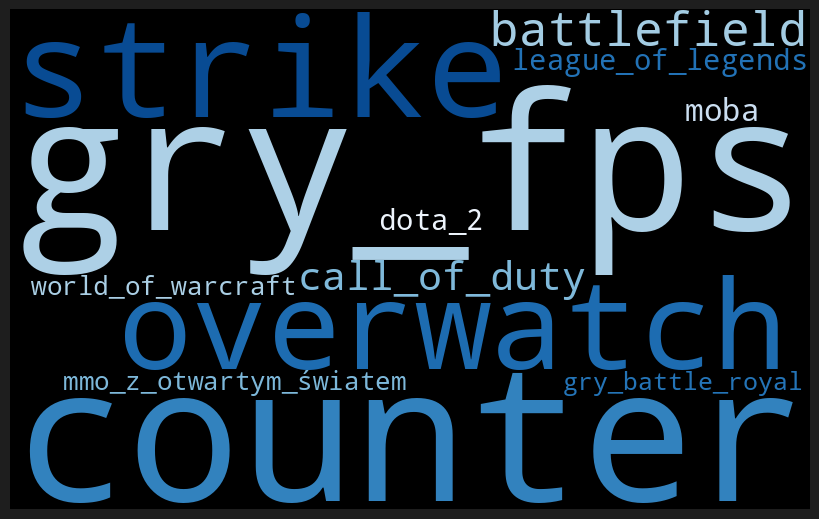

{'gry_fps': 1.0, 'counter': 1.0, 'strike': 1.0, 'overwatch': 1.0, 'battlefield': 1.0, 'call_of_duty': 1.0, 'moba': 0.5454545454545454, 'league_of_legends': 0.5454545454545454, 'dota_2': 0.5454545454545454, 'mmo_z_otwartym_światem': 0.4318181818181818, 'world_of_warcraft': 0.4318181818181818, 'gry_battle_royal': 0.4090909090909091, 'playerunknown_battleground': 0.4090909090909091, 'fortnite': 0.4090909090909091, 'gry_strategiczne': 0.4090909090909091, 'starcraft_2': 0.4090909090909091, 'gry_sportowe': 0.38636363636363635, 'fifa': 0.38636363636363635, 'need_for_speed': 0.38636363636363635, 'gry_wojenne': 0.3409090909090909, 'world_of_tanks': 0.3409090909090909, 'war_thunder': 0.3409090909090909, 'armored_warfare': 0.3409090909090909, 'gry_na_urządzenia_mobilne': 0.18181818181818182, 'vainglory': 0.18181818181818182, 'clash_of_clans': 0.18181818181818182, 'clash_royale': 0.18181818181818182, 'sandboxes': 0.022727272727272728, 'roblox': 0.022727272727272728, 'minecraft_': 0.022727272727272

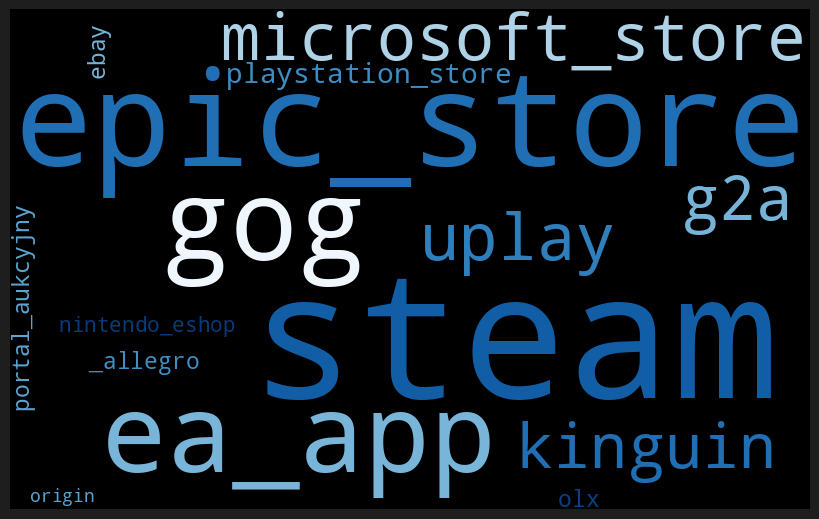

{'steam': 1.0, 'epic_store': 0.6857142857142857, 'gog': 0.4857142857142857, 'ea_app': 0.45714285714285713, 'microsoft_store': 0.3, 'uplay': 0.3, 'kinguin': 0.2714285714285714, 'g2a': 0.2714285714285714, 'playstation_store': 0.22857142857142856, 'portal_aukcyjny': 0.14285714285714285, '_allegro': 0.14285714285714285, 'olx': 0.14285714285714285, 'ebay': 0.14285714285714285, 'nintendo_eshop': 0.11428571428571428, 'origin': 0.08571428571428572, 'appstore': 0.014285714285714285, 'i_strona_lola': 0.014285714285714285, 'gdzie_się_pobiera_ich_grę_': 0.014285714285714285, 'battle': 0.014285714285714285, 'net': 0.014285714285714285, 'battle_net_': 0.014285714285714285, 'battle_net': 0.014285714285714285, 'eneba': 0.014285714285714285}





In [ ]:
for xx in cloud_xx[-2:]:
  print(xx)
  word_set = df[ xx ].dropna().astype('str')
  word_set = " ".join(text for text in word_set).replace("np.", "").replace("nan", "").lower()
  print(word_set[:200])
  fig, words = make_word_cloud(word_set, 800, 500, '#1E1E1E', 'Blues')
  print(words)
  print('\n\n')

W jakie gatunki grasz? 
strzelanki, fps, logiczne, przygodowe, planszowe, symulatory zręcznościowe, akcji, strzelanki, fps, rpg, wyścigowe, przygodowe, sportowe zręcznościowe, akcji, strzelanki, fps, rpg, wyścigowe, przygodo


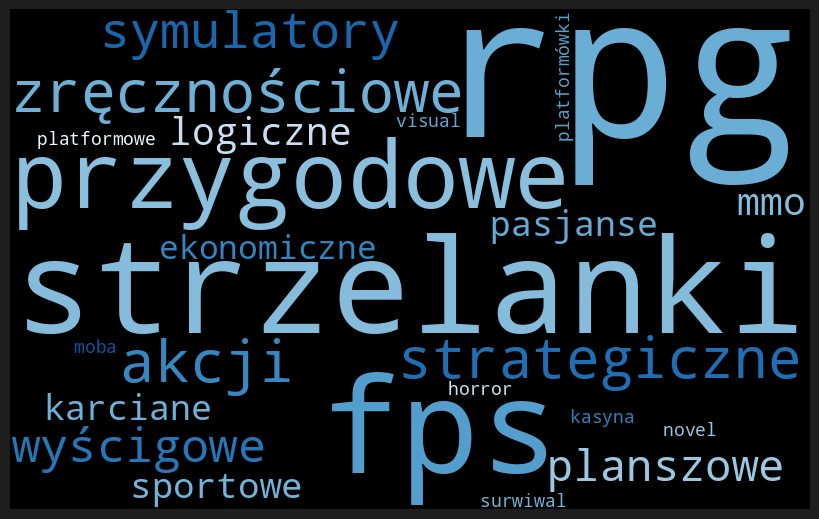

{'rpg': 1.0, 'strzelanki': 0.9482758620689655, 'fps': 0.9482758620689655, 'przygodowe': 0.8448275862068966, 'zręcznościowe': 0.8275862068965517, 'akcji': 0.8275862068965517, 'strategiczne': 0.7586206896551724, 'symulatory': 0.5862068965517241, 'wyścigowe': 0.5344827586206896, 'planszowe': 0.46551724137931033, 'logiczne': 0.3448275862068966, 'mmo': 0.3448275862068966, 'sportowe': 0.3103448275862069, 'karciane': 0.29310344827586204, 'pasjanse': 0.29310344827586204, 'ekonomiczne': 0.25862068965517243, 'visual': 0.017241379310344827, 'novel': 0.017241379310344827, 'moba': 0.017241379310344827, 'platformówki': 0.017241379310344827, 'platformowe': 0.017241379310344827, 'kasyna': 0.017241379310344827, 'surwiwal': 0.017241379310344827, 'horror': 0.017241379310344827}



Jakie są Twoje ulubione gry (max. 3)?
fortnite minecraft gothic elden_ring red_dead_redemption spider_man_ genshin_impact lol fortnite life_is_strange crusader_kings_2 league_of_legends tes5:_skyrim wiedźmin:_dziki_gon fifa thi

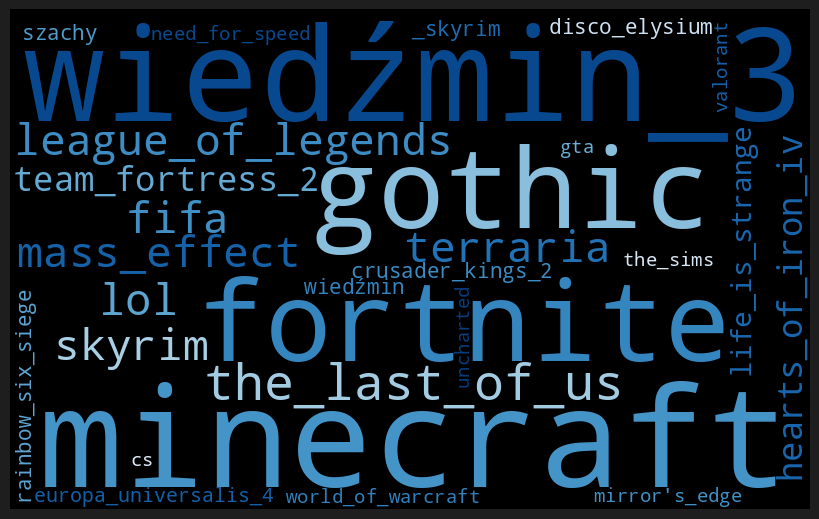

{'minecraft': 1.0, 'wiedźmin_3': 0.875, 'fortnite': 0.625, 'gothic': 0.625, 'the_last_of_us': 0.5, 'lol': 0.375, 'league_of_legends': 0.375, 'fifa': 0.375, 'terraria': 0.375, 'skyrim': 0.375, 'mass_effect': 0.375, 'team_fortress_2': 0.375, 'hearts_of_iron_iv': 0.375, 'life_is_strange': 0.25, 'crusader_kings_2': 0.25, '_skyrim': 0.25, 'wiedźmin': 0.25, 'szachy': 0.25, 'rainbow_six_siege': 0.25, 'disco_elysium': 0.25, 'europa_universalis_4': 0.25, 'need_for_speed': 0.25, 'gta': 0.25, 'the_sims': 0.25, "mirror's_edge": 0.25, 'world_of_warcraft': 0.25, 'uncharted': 0.25, 'valorant': 0.25, 'cs': 0.25, 'wiedźmin_3_dziki_gon': 0.25, 'elden_ring': 0.125, 'red_dead_redemption': 0.125, 'spider_man_': 0.125, 'genshin_impact': 0.125, 'tes5': 0.125, '_dziki_gon': 0.125, 'thief': 0.125, 'hogwart_legacy__': 0.125, 'disciples_sacred_land_': 0.125, 'factorio': 0.125, '7_days_to_die': 0.125, 'gta_': 0.125, 'kenshi': 0.125, 'dwarf_fortress': 0.125, 'starbound_': 0.125, 'workers_': 0.125, '_resources': 0.

In [ ]:
for xx in cloud_xx[:2]:
  print(xx)
  word_set = df[ xx ].dropna().astype('str')
  word_set = " ".join(text for text in word_set).replace("Gry", '').replace("gry", '').replace("  ", " ").replace("np.", "").replace("nan", "").replace("Gothic_", "gothic").lower()
  print(word_set[:200])
  fig, words = make_word_cloud(word_set, 800, 500, '#1E1E1E', 'Blues')
  print(words)
  print('\n\n')

Po co grasz? 
żeby odpocząć, odstresować się, z nudy, dla zabicia czasu, dla towarzystwa, spotkania z innymi graczami, żeby się czegoś nauczyć się, rozwinąć jakąś umiejętność żeby odpocząć, odstresować się, dla emo


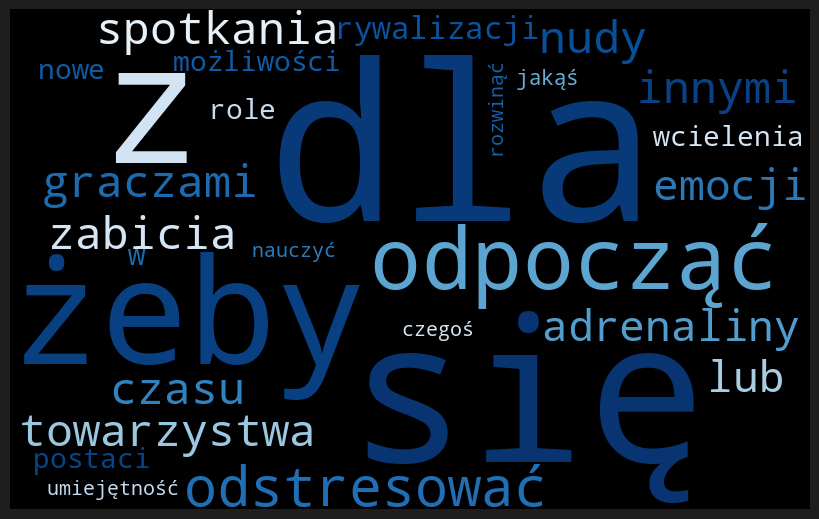




Skąd czerpiesz informacje na temat gier?
od znajomych, rodziny, z portali społecznościowych, z reklam w internecie, przez wyszukiwarkę ( szukam w google), z serwisów internetowych na temat gier, z materiałów wideo publikowanych na serwisach 


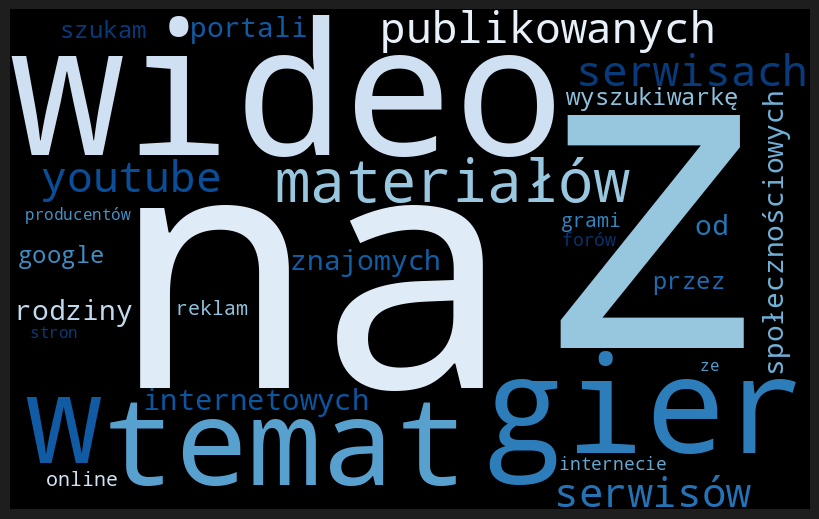




Jakie gatunki gier multi-player wybierasz?
 battle royal ( playerunknown battleground, fortnite) fps ( counter-strike, overwatch, battlefield, call of duty), moba ( league of legends, dota 2), battle royal ( playerunknown battleground, fortnit


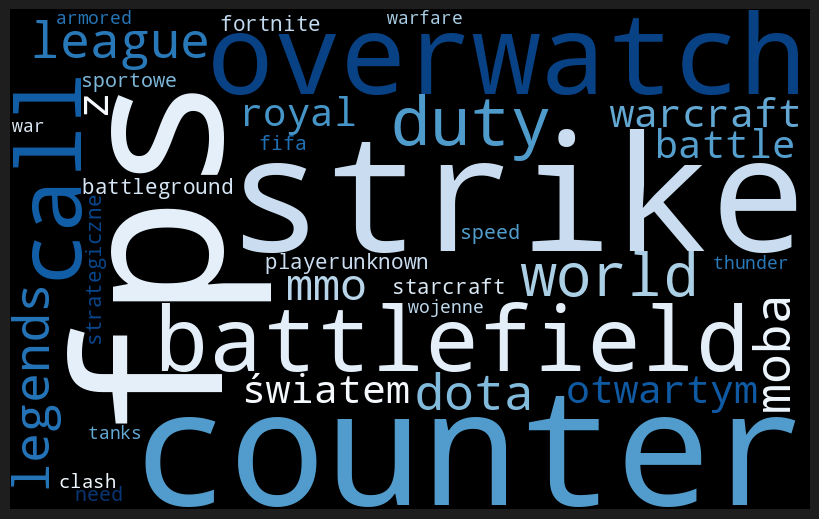




Z jakich platform korzystasz?
steam, origin, epic store playstation store steam, origin, microsoft store, epic store, gog, kinguin/g2a, uplay steam, origin, epic store, gog, kinguin/g2a, uplay, playstation store steam, origin, por


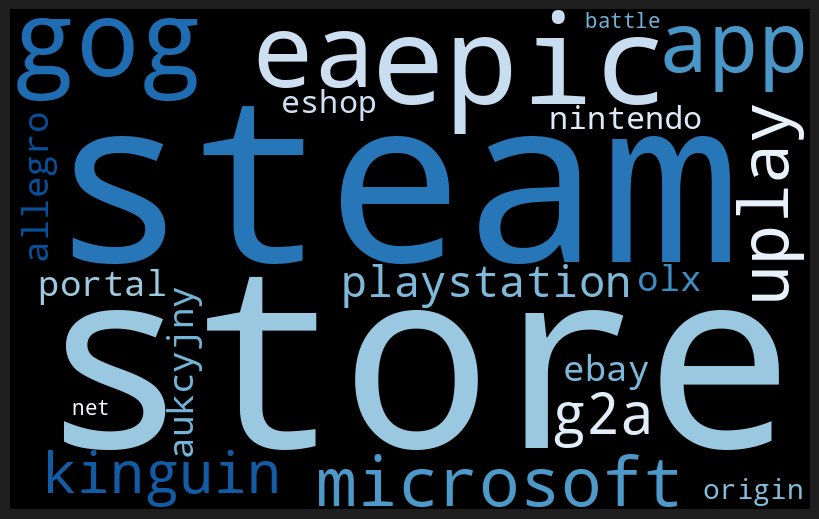

In [ ]:
for xx in cloud_xx[2:]:
  print(xx)
  word_set = df[ xx ].dropna().astype('str')
  word_set = " ".join(text for text in word_set).replace("Gry", '').replace("gry", '').replace("  ", " ").replace("np.", "").replace("nan", "").replace("Gothic_", "gothic").lower()
  print(word_set[:200])
  fig, words = make_word_cloud(word_set, 800, 500, '#1E1E1E', 'Blues')
  print(words)
  print('\n\n')

Po co grasz? 
żeby odpocząć, odstresować się, z nudy, dla zabicia czasu, dla towarzystwa, spotkania z innymi graczami, żeby się czegoś nauczyć się, rozwinąć jakąś umiejętność żeby odpocząć, odstresować się, dla emo


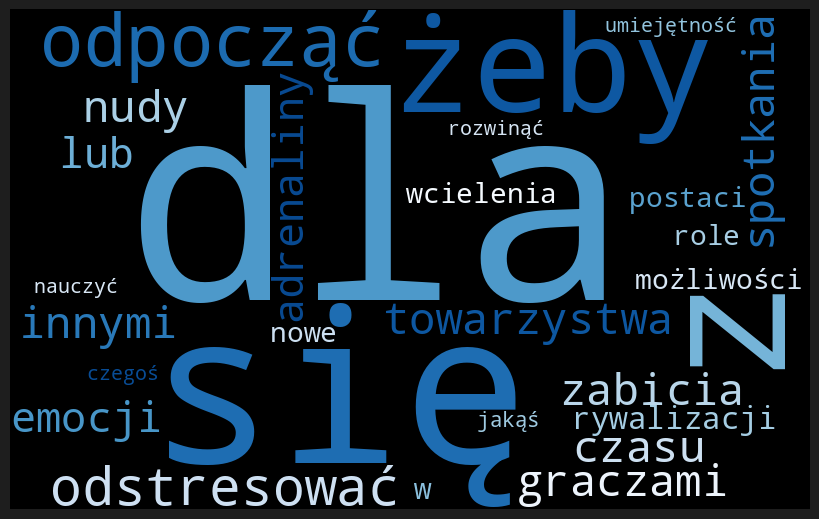

{'dla': 1.0, 'się': 0.8143712574850299, 'z': 0.5568862275449101, 'żeby': 0.5269461077844312, 'odpocząć': 0.4251497005988024, 'odstresować': 0.4251497005988024, 'nudy': 0.2754491017964072, 'zabicia': 0.2754491017964072, 'czasu': 0.2754491017964072, 'towarzystwa': 0.2694610778443114, 'spotkania': 0.2694610778443114, 'innymi': 0.2694610778443114, 'graczami': 0.2694610778443114, 'emocji': 0.24550898203592814, 'adrenaliny': 0.24550898203592814, 'lub': 0.24550898203592814, 'rywalizacji': 0.24550898203592814, 'w': 0.20958083832335328, 'możliwości': 0.19760479041916168, 'wcielenia': 0.19760479041916168, 'nowe': 0.19760479041916168, 'role': 0.19760479041916168, 'postaci': 0.19760479041916168, 'jakąś': 0.10179640718562874, 'czegoś': 0.09580838323353294, 'nauczyć': 0.09580838323353294, 'rozwinąć': 0.09580838323353294, 'umiejętność': 0.09580838323353294, 'fabuły': 0.011976047904191617, 'uzależnienia': 0.005988023952095809, 'po': 0.005988023952095809, 'prostu': 0.005988023952095809, 'sprawia': 0.00

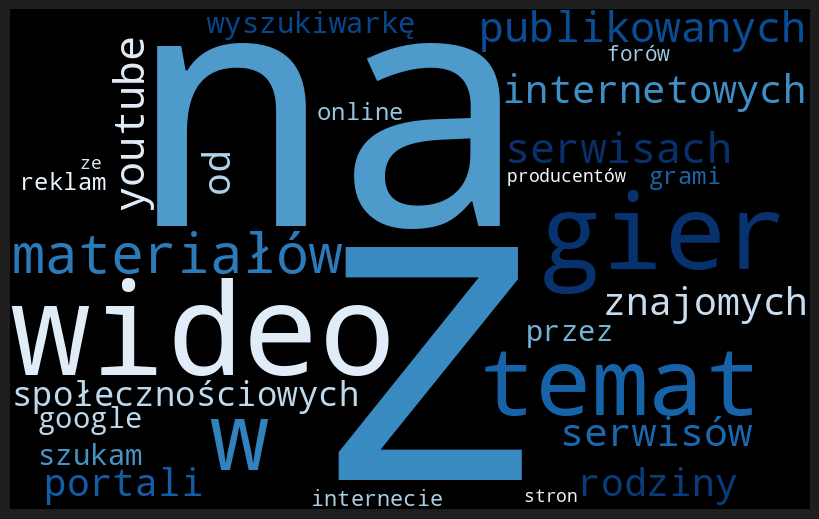

{'z': 1.0, 'na': 0.5384615384615384, 'wideo': 0.5384615384615384, 'gier': 0.3333333333333333, 'w': 0.27350427350427353, 'temat': 0.2692307692307692, 'materiałów': 0.2692307692307692, 'publikowanych': 0.2692307692307692, 'serwisach': 0.2692307692307692, 'youtube': 0.2692307692307692, 'serwisów': 0.24786324786324787, 'internetowych': 0.23931623931623933, 'od': 0.23076923076923078, 'znajomych': 0.2264957264957265, 'rodziny': 0.2264957264957265, 'portali': 0.2222222222222222, 'społecznościowych': 0.2222222222222222, 'przez': 0.1623931623931624, 'wyszukiwarkę': 0.1623931623931624, 'szukam': 0.1623931623931624, 'google': 0.1623931623931624, 'reklam': 0.1111111111111111, 'grami': 0.10683760683760683, 'online': 0.10683760683760683, 'internecie': 0.08547008547008547, 'forów': 0.0811965811965812, 'ze': 0.05982905982905983, 'stron': 0.05982905982905983, 'producentów': 0.05982905982905983, 'innych': 0.02564102564102564, 'grach': 0.02564102564102564, 'newsletterów': 0.021367521367521368, 'czasopism

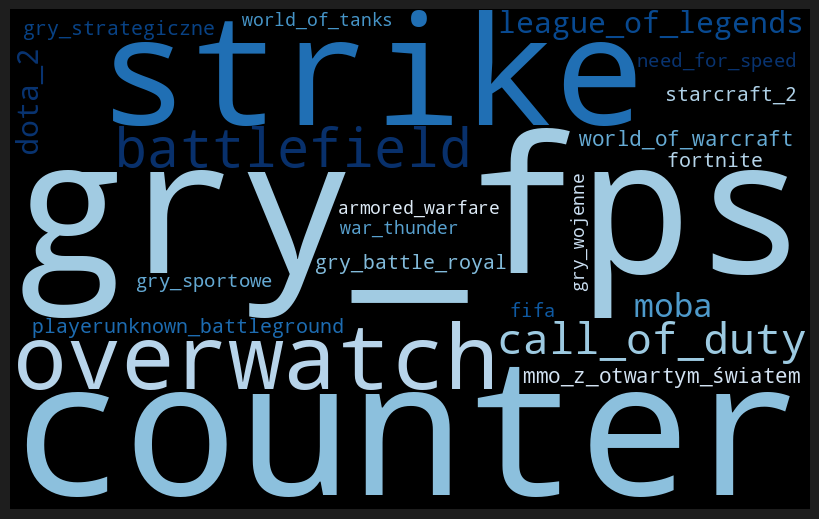

{'gry_fps': 1.0, 'counter': 1.0, 'strike': 1.0, 'overwatch': 1.0, 'battlefield': 1.0, 'call_of_duty': 1.0, 'moba': 0.5454545454545454, 'league_of_legends': 0.5454545454545454, 'dota_2': 0.5454545454545454, 'mmo_z_otwartym_światem': 0.4318181818181818, 'world_of_warcraft': 0.4318181818181818, 'gry_battle_royal': 0.4090909090909091, 'playerunknown_battleground': 0.4090909090909091, 'fortnite': 0.4090909090909091, 'gry_strategiczne': 0.4090909090909091, 'starcraft_2': 0.4090909090909091, 'gry_sportowe': 0.38636363636363635, 'fifa': 0.38636363636363635, 'need_for_speed': 0.38636363636363635, 'gry_wojenne': 0.3409090909090909, 'world_of_tanks': 0.3409090909090909, 'war_thunder': 0.3409090909090909, 'armored_warfare': 0.3409090909090909, 'gry_na_urządzenia_mobilne': 0.18181818181818182, 'vainglory': 0.18181818181818182, 'clash_of_clans': 0.18181818181818182, 'clash_royale': 0.18181818181818182, 'sandboxes': 0.022727272727272728, 'roblox': 0.022727272727272728, 'minecraft_': 0.022727272727272

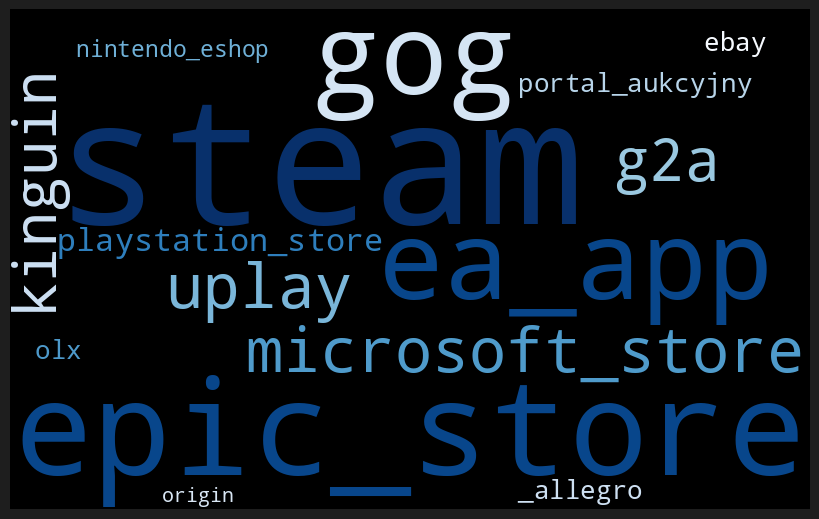

{'steam': 1.0, 'epic_store': 0.6857142857142857, 'gog': 0.4857142857142857, 'ea_app': 0.45714285714285713, 'microsoft_store': 0.3, 'uplay': 0.3, 'kinguin': 0.2714285714285714, 'g2a': 0.2714285714285714, 'playstation_store': 0.22857142857142856, 'portal_aukcyjny': 0.14285714285714285, '_allegro': 0.14285714285714285, 'olx': 0.14285714285714285, 'ebay': 0.14285714285714285, 'nintendo_eshop': 0.11428571428571428, 'origin': 0.08571428571428572, 'appstore': 0.014285714285714285, 'i_strona_lola': 0.014285714285714285, 'gdzie_się_pobiera_ich_grę_': 0.014285714285714285, 'battle': 0.014285714285714285, 'net': 0.014285714285714285, 'battle_net_': 0.014285714285714285, 'battle_net': 0.014285714285714285, 'eneba': 0.014285714285714285}





In [ ]:
# words printed underneath
for xx in cloud_xx[2:]:
  print(xx)
  word_set = df[ xx ].dropna().astype('str')
  word_set = " ".join(text for text in word_set).replace("  ", " ").replace("np.", "").replace("nan", "").replace("Gothic_", "gothic").lower()
  print(word_set[:200])
  fig, words = make_word_cloud(word_set, 800, 500, '#1E1E1E', 'Blues')
  print(words)
  print('\n\n')

In [ ]:
for xx in cloud_xx[:3]:
  print(xx)
  word_set = df[ xx ].dropna().astype('str')
  word_set = " ".join(text for text in word_set).replace("  ", " ").replace("np.", "").replace("nan", "").replace("Gothic_", "gothic").replace("__", "_").lower()
  #print(word_set)
  print( Counter(word_set.split()).most_common() )
  print('\n\n')

W jakie gatunki grasz? 
[('gry', 253), ('strzelanki,', 55), ('fps,', 55), ('rpg,', 50), ('zręcznościowe,', 48), ('akcji,', 48), ('przygodowe,', 44), ('strategiczne,', 43), ('symulatory', 30), ('wyścigowe,', 30), ('logiczne,', 20), ('planszowe,', 18), ('karciane', 17), ('/', 17), ('pasjanse,', 16), ('sportowe,', 12), ('mmo', 12), ('ekonomiczne,', 10), ('planszowe', 9), ('mmo,', 8), ('rpg', 8), ('sportowe', 6), ('ekonomiczne', 5), ('przygodowe', 5), ('symulatory,', 4), ('visual', 1), ('novel', 1), ('strategiczne', 1), ('moba,', 1), ('platformówki', 1), ('platformowe', 1), ('wyścigowe', 1), ('kasyna', 1), ('pasjanse', 1), ('surwiwal', 1), ('horror', 1)]



Jakie są Twoje ulubione gry (max. 3)?
[('minecraft', 8), ('wiedźmin_3', 7), ('fortnite', 5), ('gothic', 3), ('lol', 3), ('league_of_legends', 3), ('fifa', 3), ('the_last_of_us', 3), ('terraria', 3), ('skyrim', 3), ('mass_effect', 3), ('hearts_of_iron_iv', 3), ('life_is_strange', 2), ('crusader_kings_2', 2), ('szachy', 2), ('disco_elysiu

W jakie gatunki grasz? 
strzelanki, fps, logiczne, przygodowe, planszowe, symulatory zręcznościowe, akcji, strzelanki, fps, rpg, wyścigowe, przygodowe, sportowe zręcznościowe, akcji, strzelanki, fps, rpg, wyścigowe, przygodo


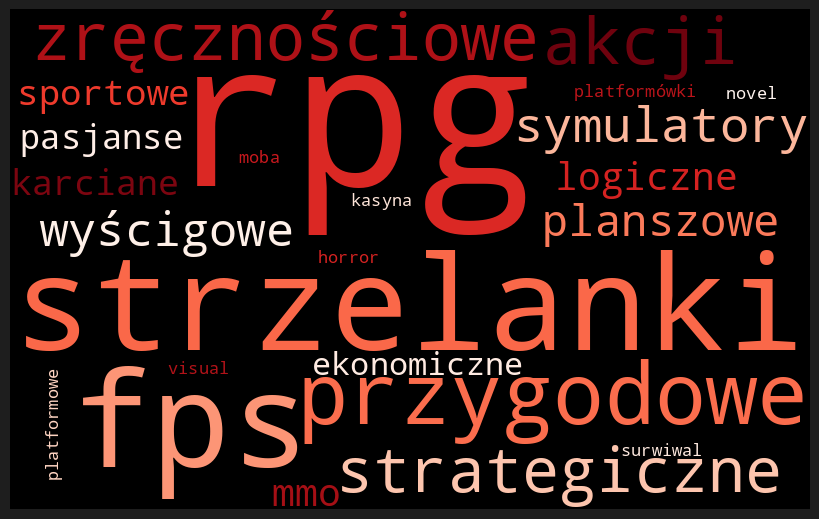

{'rpg': 1.0, 'strzelanki': 0.9482758620689655, 'fps': 0.9482758620689655, 'przygodowe': 0.8448275862068966, 'zręcznościowe': 0.8275862068965517, 'akcji': 0.8275862068965517, 'strategiczne': 0.7586206896551724, 'symulatory': 0.5862068965517241, 'wyścigowe': 0.5344827586206896, 'planszowe': 0.46551724137931033, 'logiczne': 0.3448275862068966, 'mmo': 0.3448275862068966, 'sportowe': 0.3103448275862069, 'karciane': 0.29310344827586204, 'pasjanse': 0.29310344827586204, 'ekonomiczne': 0.25862068965517243, 'visual': 0.017241379310344827, 'novel': 0.017241379310344827, 'moba': 0.017241379310344827, 'platformówki': 0.017241379310344827, 'platformowe': 0.017241379310344827, 'kasyna': 0.017241379310344827, 'surwiwal': 0.017241379310344827, 'horror': 0.017241379310344827}



Jakie są Twoje ulubione gry (max. 3)?
fortnite, minecraft, gothic elden ring, red dead redemption, spider man genshin impact, lol, fortnite life strange, crusader kings league legends tes5: skyrim, wiedźmin: dziki gon, fifa thi

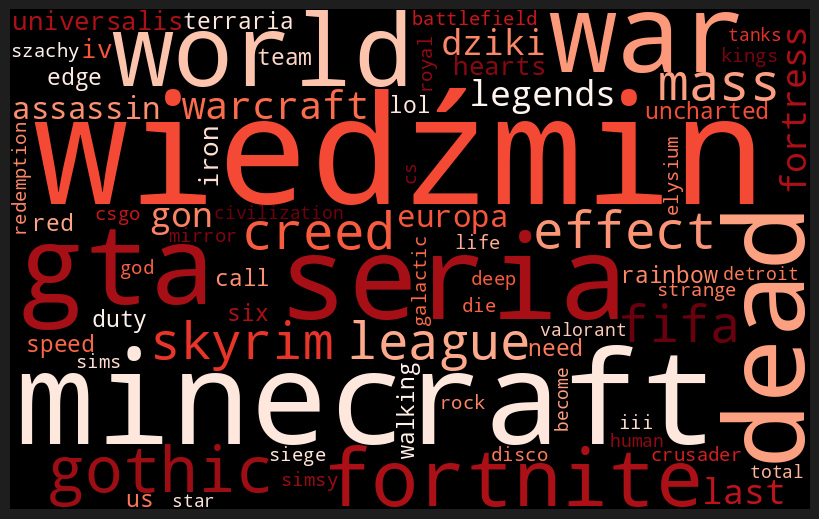

{'wiedźmin': 1.0, 'minecraft': 0.7142857142857143, 'seria': 0.5714285714285714, 'dead': 0.5, 'gta': 0.5, 'war': 0.5, 'world': 0.5, 'fortnite': 0.35714285714285715, 'gothic': 0.35714285714285715, 'league': 0.35714285714285715, 'skyrim': 0.35714285714285715, 'fifa': 0.35714285714285715, 'creed': 0.35714285714285715, 'mass': 0.35714285714285715, 'effect': 0.35714285714285715, 'warcraft': 0.35714285714285715, 'legends': 0.2857142857142857, 'dziki': 0.2857142857142857, 'gon': 0.2857142857142857, 'fortress': 0.2857142857142857, 'last': 0.2857142857142857, 'assassin': 0.2857142857142857, 'europa': 0.2857142857142857, 'universalis': 0.2857142857142857, 'iv': 0.2857142857142857, 'hearts': 0.2857142857142857, 'iron': 0.2857142857142857, 'red': 0.21428571428571427, 'lol': 0.21428571428571427, 'rainbow': 0.21428571428571427, 'six': 0.21428571428571427, 'us': 0.21428571428571427, 'terraria': 0.21428571428571427, 'team': 0.21428571428571427, 'call': 0.21428571428571427, 'duty': 0.21428571428571427, 

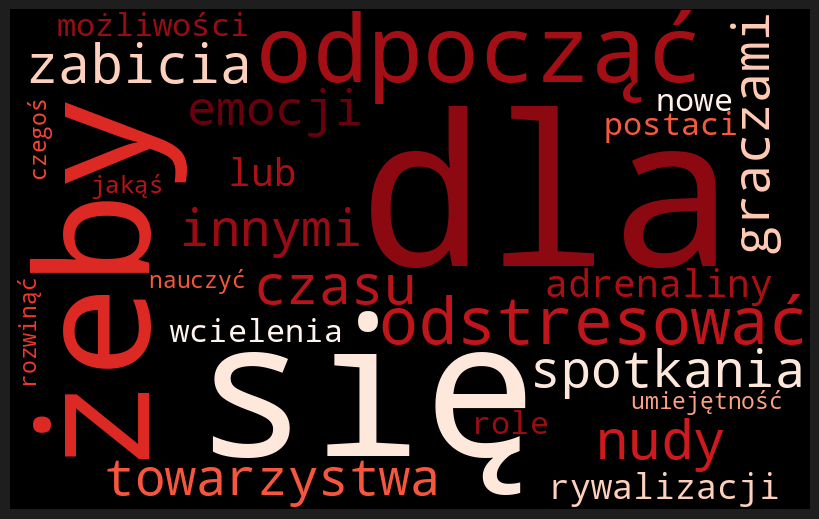

{'dla': 1.0, 'się': 0.8143712574850299, 'żeby': 0.5269461077844312, 'odpocząć': 0.4251497005988024, 'odstresować': 0.4251497005988024, 'nudy': 0.2754491017964072, 'zabicia': 0.2754491017964072, 'czasu': 0.2754491017964072, 'towarzystwa': 0.2694610778443114, 'spotkania': 0.2694610778443114, 'innymi': 0.2694610778443114, 'graczami': 0.2694610778443114, 'emocji': 0.24550898203592814, 'adrenaliny': 0.24550898203592814, 'lub': 0.24550898203592814, 'rywalizacji': 0.24550898203592814, 'możliwości': 0.19760479041916168, 'wcielenia': 0.19760479041916168, 'nowe': 0.19760479041916168, 'role': 0.19760479041916168, 'postaci': 0.19760479041916168, 'jakąś': 0.10179640718562874, 'czegoś': 0.09580838323353294, 'nauczyć': 0.09580838323353294, 'rozwinąć': 0.09580838323353294, 'umiejętność': 0.09580838323353294, 'fabuły': 0.011976047904191617, 'uzależnienia': 0.005988023952095809, 'prostu': 0.005988023952095809, 'sprawia': 0.005988023952095809, 'przyjemnosc': 0.005988023952095809, 'języki': 0.005988023952

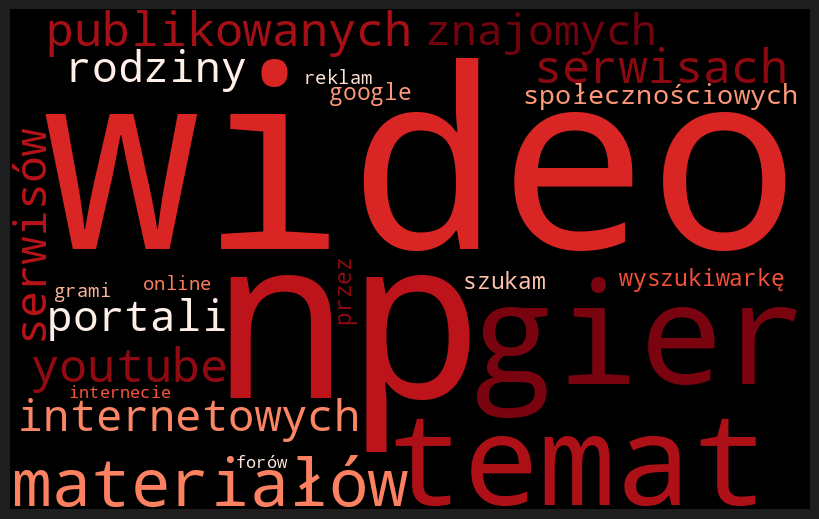

{'wideo': 1.0, 'np': 0.8015873015873016, 'gier': 0.6190476190476191, 'temat': 0.5, 'materiałów': 0.5, 'publikowanych': 0.5, 'serwisach': 0.5, 'youtube': 0.5, 'serwisów': 0.4603174603174603, 'internetowych': 0.4444444444444444, 'znajomych': 0.42063492063492064, 'rodziny': 0.42063492063492064, 'portali': 0.4126984126984127, 'społecznościowych': 0.4126984126984127, 'przez': 0.30158730158730157, 'wyszukiwarkę': 0.30158730158730157, 'szukam': 0.30158730158730157, 'google': 0.30158730158730157, 'reklam': 0.20634920634920634, 'grami': 0.1984126984126984, 'online': 0.1984126984126984, 'internecie': 0.15873015873015872, 'forów': 0.15079365079365079, 'stron': 0.1111111111111111, 'producentów': 0.1111111111111111, 'innych': 0.047619047619047616, 'grach': 0.047619047619047616, 'newsletterów': 0.03968253968253968, 'czasopism': 0.031746031746031744, 'blogów': 0.031746031746031744, 'steam': 0.015873015873015872, 'programów': 0.015873015873015872, 'telewizyjnych': 0.015873015873015872, 'platforma': 0.

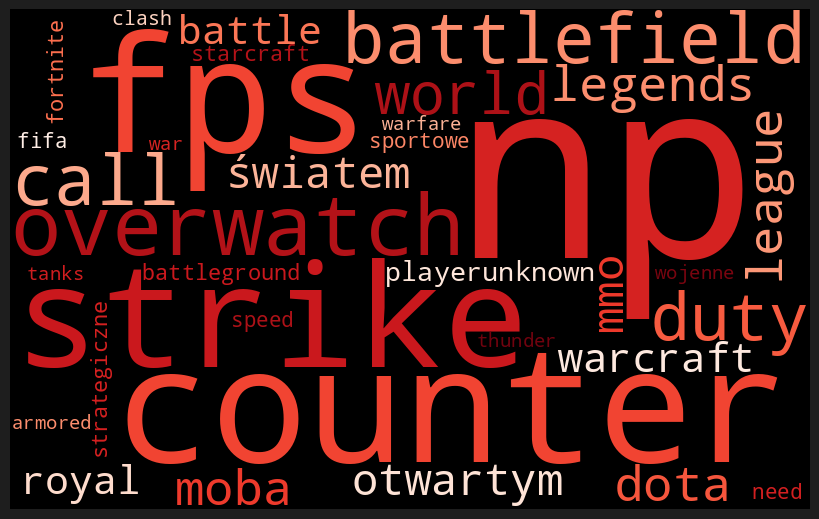

{'np': 1.0, 'fps': 0.2682926829268293, 'counter': 0.2682926829268293, 'strike': 0.2682926829268293, 'overwatch': 0.2682926829268293, 'battlefield': 0.2682926829268293, 'call': 0.2682926829268293, 'duty': 0.2682926829268293, 'world': 0.2073170731707317, 'moba': 0.14634146341463414, 'league': 0.14634146341463414, 'legends': 0.14634146341463414, 'dota': 0.14634146341463414, 'mmo': 0.11585365853658537, 'otwartym': 0.11585365853658537, 'światem': 0.11585365853658537, 'warcraft': 0.11585365853658537, 'battle': 0.10975609756097561, 'royal': 0.10975609756097561, 'playerunknown': 0.10975609756097561, 'battleground': 0.10975609756097561, 'fortnite': 0.10975609756097561, 'strategiczne': 0.10975609756097561, 'starcraft': 0.10975609756097561, 'sportowe': 0.10365853658536585, 'fifa': 0.10365853658536585, 'need': 0.10365853658536585, 'speed': 0.10365853658536585, 'clash': 0.0975609756097561, 'wojenne': 0.09146341463414634, 'tanks': 0.09146341463414634, 'war': 0.09146341463414634, 'thunder': 0.0914634

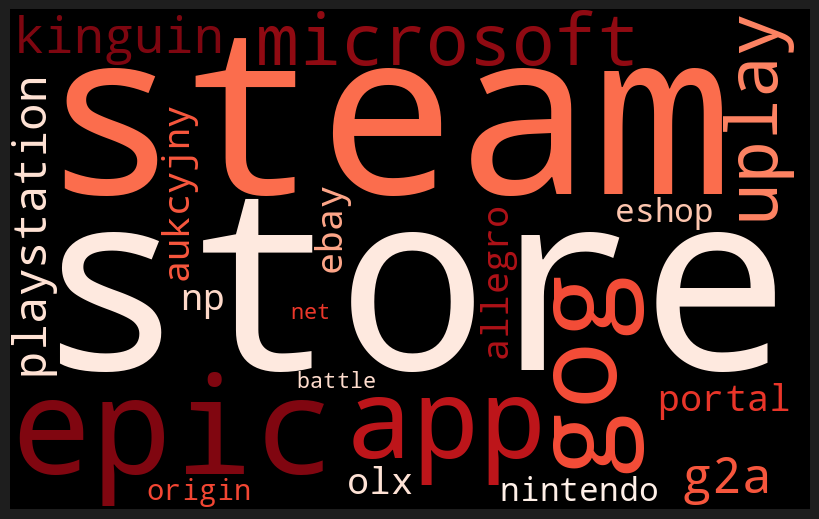

{'store': 1.0, 'steam': 0.8235294117647058, 'epic': 0.5647058823529412, 'gog': 0.4, 'app': 0.3764705882352941, 'microsoft': 0.24705882352941178, 'uplay': 0.24705882352941178, 'kinguin': 0.2235294117647059, 'g2a': 0.2235294117647059, 'playstation': 0.18823529411764706, 'portal': 0.11764705882352941, 'aukcyjny': 0.11764705882352941, 'np': 0.11764705882352941, 'allegro': 0.11764705882352941, 'olx': 0.11764705882352941, 'ebay': 0.11764705882352941, 'nintendo': 0.09411764705882353, 'eshop': 0.09411764705882353, 'origin': 0.07058823529411765, 'battle': 0.03529411764705882, 'net': 0.03529411764705882, 'appstore': 0.011764705882352941, 'strona': 0.011764705882352941, 'lola': 0.011764705882352941, 'gdzie': 0.011764705882352941, 'się': 0.011764705882352941, 'pobiera': 0.011764705882352941, 'ich': 0.011764705882352941, 'grę': 0.011764705882352941, 'eneba': 0.011764705882352941}





In [ ]:
# raw

for xx in cloud_xx[:]:
  print(xx)
  word_set = df[ xx ].dropna().astype('str')
  word_set = " ".join(text for text in word_set).lower()
  word_set = " ".join( w for w in word_set.split() if len(str(w)) > 2 and w != 'gry' )
  print(word_set[:200])
  fig, words = make_word_cloud(word_set, 800, 500, '#1E1E1E', 'Reds')
  print(words)
  print('\n\n')

In [ ]:
for x in df.columns:
  print(x)
  print(df[x].nunique())
  print()

Sygnatura czasowa
88

Czy grasz w gry? 
2

W jakie gatunki grasz? 
78

Jakie są Twoje ulubione gry (max. 3)?
79

Po co grasz? 
42

Jak często grasz?
5

Ile czasu średnio spędzasz w grze podczas jednej sesji? 
6

Skąd czerpiesz informacje na temat gier?
67

Czy grasz na komputerze lub laptopie?
2

W jakie gry na komputerze/laptopie grasz?
3

Czy grasz na konsoli? 
2

Na jakich konsolach grasz?
22

Z których modeli abonentowych korzystasz?
8

Czy grasz na urządzaniu mobilnym lub tablecie?
2

Jaki posiadasz system operacyjny na telefonie/tablecie? 
3

Jak pozyskujesz gry mobilne? 
1

W jaki sposób grasz? 
5

Jakie gatunki gier multi-player wybierasz?
44

Jak pozyskujesz gry?
16

Jakie są twoje średnie wydatki na zakup samych gier (w miesiącu)?
7

Jakie są twoje średnie wydatki na dodatki do gier i mikropłatności (w miesiącu)? 
10

Jaką preferujesz metodę płatności, jeśli chodzi o gry? 
26

Czy kupujesz gry w wersji cyfrowej? 
2

Dlaczego kupujesz cyfrowe wersje gry? 
17

Z jakich platform

In [ ]:
ll = [
    'Jak często grasz?',        'Ile czasu średnio spędzasz w grze podczas jednej sesji? ','Czy grasz na komputerze lub laptopie?',
    'W jakie gry na komputerze/laptopie grasz?', 'Czy grasz na konsoli? ',
       'Na jakich konsolach grasz?',
       'Z których modeli abonentowych korzystasz?',
       'Czy grasz na urządzaniu mobilnym lub tablecie?',
       'Jaki posiadasz system operacyjny na telefonie/tablecie? ',
       'Jak pozyskujesz gry mobilne? ', 'W jaki sposób grasz? ','Jak pozyskujesz gry mobilne? ', 'W jaki sposób grasz? ',
       'Jakie gatunki gier multi-player wybierasz?', 'Jak pozyskujesz gry?',
       'Jakie są twoje średnie wydatki na zakup samych gier (w miesiącu)?',
       'Jakie są twoje średnie wydatki na dodatki do gier i mikropłatności (w miesiącu)? ',
       'Jaką preferujesz metodę płatności, jeśli chodzi o gry? ',
       'Czy kupujesz gry w wersji cyfrowej? ',       'Dlaczego kupujesz cyfrowe wersje gry? ',
'Czy kupujesz gry w wersji fizycznej (pudełkowej)? ',
       'Czy interesujesz się e-sportem? ',
       'Jak często oglądasz rozgrywki e-sportowe?',
       'Czy posiadasz urządzenie VR?', 'Jakie urządzenie VR posiadasz?',
       'Płeć', 'Wiek', 'Miejsce zamieszkania ',
       'Wykształcenie',
]

In [ ]:
dmap = {
    'Gry instalowane na komputerze (na laptopie lub PC), Gry online w przeglądarce internetowej (np. Firefox, Chrome)':'Gry instalowane na komputerze, Gry online w przeglądarce internetowej',
    'Gry instalowane na komputerze (na laptopie lub PC)':'Gry instalowane na komputerze (na laptopie lub PC)',
    'Gry instalowane na komputerze (na laptopie lub PC), Gry online w przeglądarce internetowej (np. Firefox, Chrome), Gry instalowane na komputerze fabrycznie przez producenta': 'Gry instalowane na komputerze, w przeglądarce internetowej, instalowane na komputerze fabrycznie przez producenta'
}

In [ ]:
df['W jakie gry na komputerze/laptopie grasz?'] = df['W jakie gry na komputerze/laptopie grasz?'].map(dmap)

In [ ]:
llspec = [
    'Sytuacja finasnowa ','Sytuacja zawodowa ', 'Jakie gry oglądasz? ',   'W jaki sposób grasz? ',    'Gdzie oglądasz rozgrywki e-sportowe? ',
    'Z których modeli abonentowych korzystasz?', 'Na jakich konsolach grasz?',

    'Jak pozyskujesz gry?', 'Jakie gatunki gier multi-player wybierasz?','Jaką preferujesz metodę płatności, jeśli chodzi o gry? ',
    'Dlaczego kupujesz fizyczne wersje gry? ', 'Dlaczego kupujesz cyfrowe wersje gry? ',

]

In [ ]:
df[llspec[-5]]

Jak pozyskujesz gry?
pobieraj darmowe internetu stron producentów serwisów grami, kupuję, wymieniam siępożyczam znajomych, kolegów, rodziny kupuję, wymieniam siępożyczam znajomych, kolegów, rodziny pobieraj darmowe intern


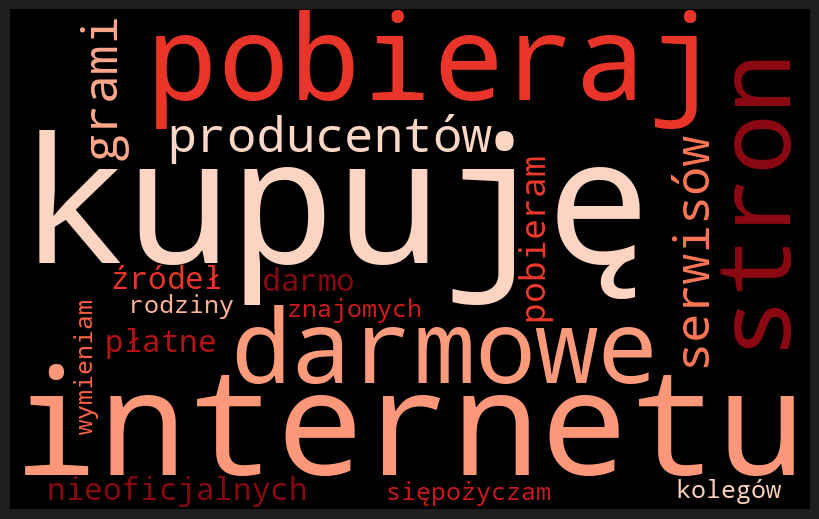

{'kupuję': 1.0, 'internetu': 0.8860759493670886, 'pobieraj': 0.620253164556962, 'darmowe': 0.620253164556962, 'stron': 0.620253164556962, 'producentów': 0.620253164556962, 'serwisów': 0.620253164556962, 'grami': 0.620253164556962, 'pobieram': 0.26582278481012656, 'nieoficjalnych': 0.26582278481012656, 'źródeł': 0.26582278481012656, 'płatne': 0.26582278481012656, 'darmo': 0.26582278481012656, 'wymieniam': 0.16455696202531644, 'siępożyczam': 0.16455696202531644, 'znajomych': 0.16455696202531644, 'kolegów': 0.16455696202531644, 'rodziny': 0.16455696202531644, 'instaluję': 0.02531645569620253, 'nowych': 0.02531645569620253, 'gier': 0.02531645569620253, 'innego': 0.012658227848101266, 'źródła': 0.012658227848101266, 'plus': 0.012658227848101266, 'subscribing': 0.012658227848101266, 'xbox': 0.012658227848101266, 'game': 0.012658227848101266, 'pass': 0.012658227848101266}
[('internetu', 70), ('pobieraj', 49), ('darmowe', 49), ('stron', 49), ('producentów', 49), ('serwisów', 49), ('kupuję', 49

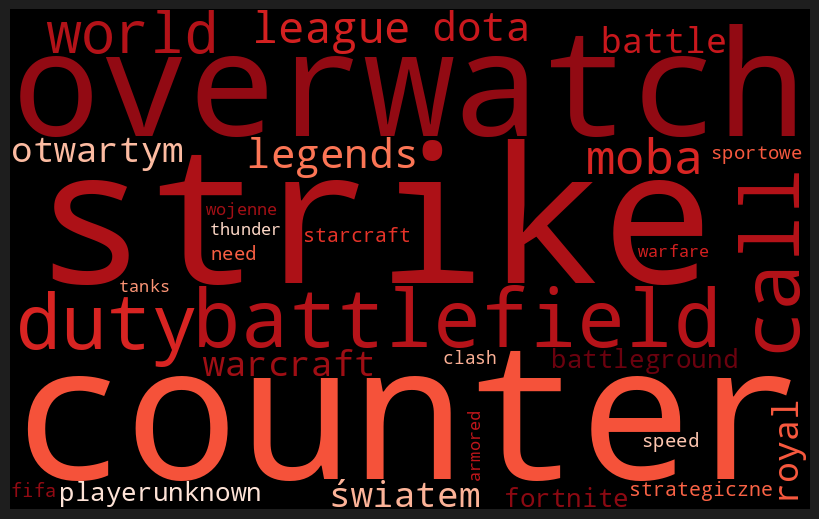

{'counter': 1.0, 'strike': 1.0, 'overwatch': 1.0, 'battlefield': 1.0, 'call': 1.0, 'duty': 1.0, 'world': 0.7727272727272727, 'moba': 0.5454545454545454, 'league': 0.5454545454545454, 'legends': 0.5454545454545454, 'dota': 0.5454545454545454, 'otwartym': 0.4318181818181818, 'światem': 0.4318181818181818, 'warcraft': 0.4318181818181818, 'battle': 0.4090909090909091, 'royal': 0.4090909090909091, 'playerunknown': 0.4090909090909091, 'battleground': 0.4090909090909091, 'fortnite': 0.4090909090909091, 'strategiczne': 0.4090909090909091, 'starcraft': 0.4090909090909091, 'sportowe': 0.38636363636363635, 'fifa': 0.38636363636363635, 'need': 0.38636363636363635, 'speed': 0.38636363636363635, 'clash': 0.36363636363636365, 'wojenne': 0.3409090909090909, 'tanks': 0.3409090909090909, 'thunder': 0.3409090909090909, 'armored': 0.3409090909090909, 'warfare': 0.3409090909090909, 'urządzenia': 0.18181818181818182, 'mobilne': 0.18181818181818182, 'vainglory': 0.18181818181818182, 'clans': 0.18181818181818

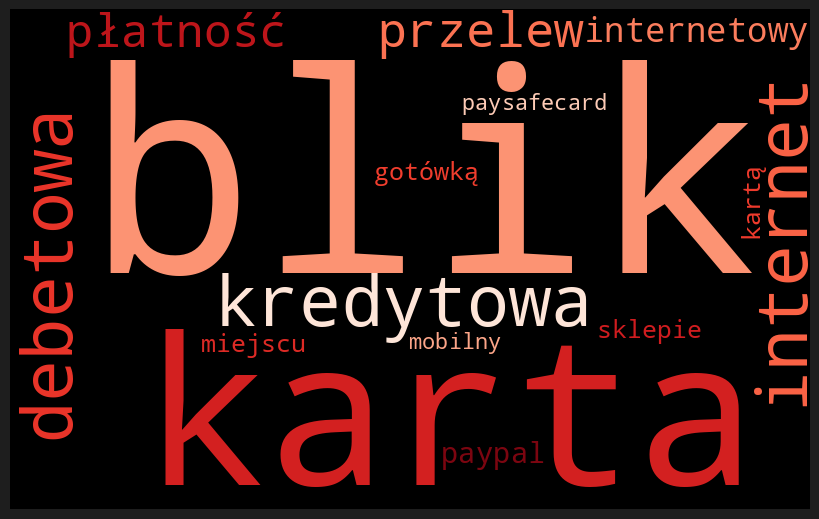

{'blik': 1.0, 'karta': 0.463768115942029, 'kredytowa': 0.463768115942029, 'debetowa': 0.463768115942029, 'internet': 0.463768115942029, 'przelew': 0.3188405797101449, 'płatność': 0.2753623188405797, 'internetowy': 0.2318840579710145, 'paypal': 0.15942028985507245, 'miejscu': 0.11594202898550725, 'sklepie': 0.11594202898550725, 'kartą': 0.11594202898550725, 'gotówką': 0.11594202898550725, 'mobilny': 0.08695652173913043, 'paysafecard': 0.08695652173913043, 'applepay': 0.014492753623188406, 'kupuję': 0.014492753623188406, 'gier': 0.014492753623188406, 'kartyzdrapki': 0.014492753623188406, 'doładowujące': 0.014492753623188406, 'moje': 0.014492753623188406, 'konto': 0.014492753623188406, 'xbox': 0.014492753623188406, 'live': 0.014492753623188406, 'google': 0.014492753623188406}
[('blik', 50), ('karta', 32), ('kredytowa', 32), ('debetowa', 32), ('internet,', 27), ('przelew', 22), ('płatność', 19), ('blik,', 19), ('internetowy,', 16), ('paypal', 11), ('miejscu', 8), ('sklepie', 8), ('kartą', 

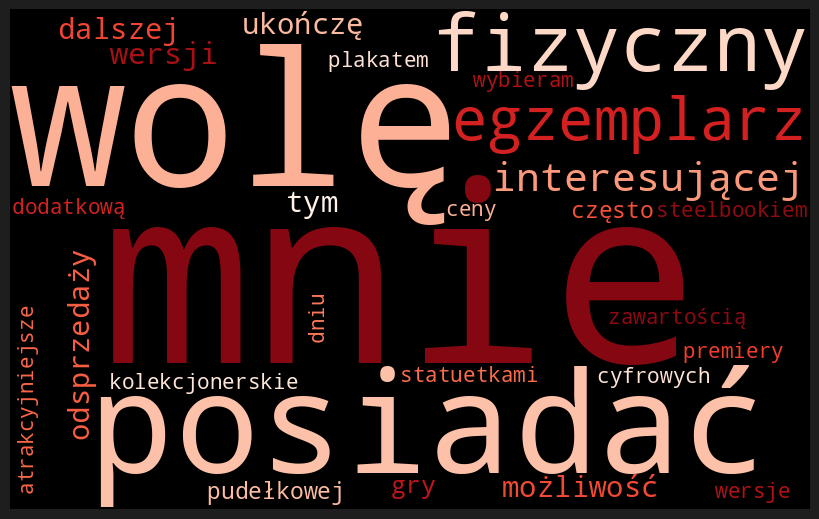

{'mnie': 1.0, 'wolę': 0.9545454545454546, 'posiadać': 0.9545454545454546, 'fizyczny': 0.9545454545454546, 'egzemplarz': 0.9545454545454546, 'interesującej': 0.9545454545454546, 'wersji': 0.5, 'możliwość': 0.45454545454545453, 'dalszej': 0.45454545454545453, 'odsprzedaży': 0.45454545454545453, 'tym': 0.45454545454545453, 'ukończę': 0.45454545454545453, 'gry': 0.3181818181818182, 'pudełkowej': 0.2727272727272727, 'często': 0.2727272727272727, 'wybieram': 0.22727272727272727, 'wersje': 0.22727272727272727, 'kolekcjonerskie': 0.22727272727272727, 'dodatkową': 0.22727272727272727, 'zawartością': 0.22727272727272727, 'statuetkami': 0.22727272727272727, 'plakatem': 0.22727272727272727, 'steelbookiem': 0.22727272727272727, 'ceny': 0.22727272727272727, 'dniu': 0.22727272727272727, 'premiery': 0.22727272727272727, 'atrakcyjniejsze': 0.22727272727272727, 'cyfrowych': 0.22727272727272727, 'czasem': 0.045454545454545456, 'tanio': 0.045454545454545456, 'biedronce': 0.045454545454545456, 'kupię': 0.0

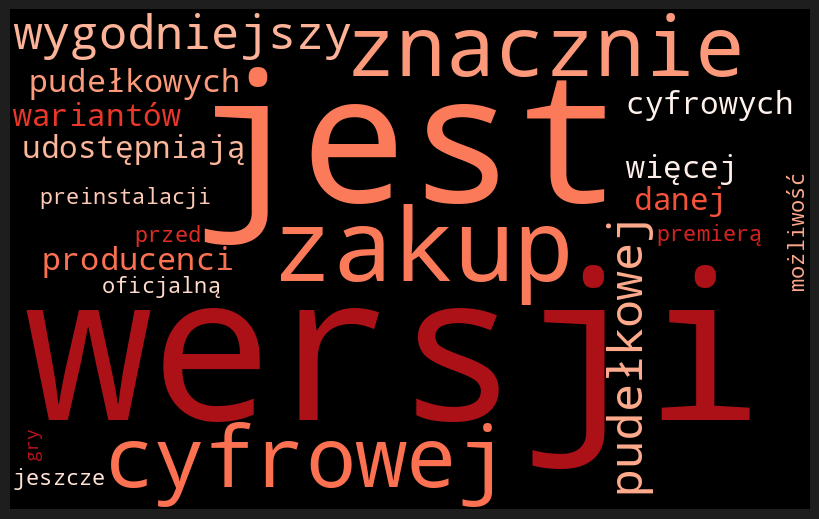

{'wersji': 1.0, 'jest': 0.75, 'zakup': 0.7386363636363636, 'cyfrowej': 0.7386363636363636, 'znacznie': 0.7386363636363636, 'wygodniejszy': 0.7386363636363636, 'pudełkowej': 0.7386363636363636, 'producenci': 0.26136363636363635, 'pudełkowych': 0.26136363636363635, 'udostępniają': 0.25, 'więcej': 0.25, 'wariantów': 0.25, 'cyfrowych': 0.25, 'danej': 0.25, 'możliwość': 0.10227272727272728, 'preinstalacji': 0.10227272727272728, 'jeszcze': 0.10227272727272728, 'przed': 0.10227272727272728, 'oficjalną': 0.10227272727272728, 'premierą': 0.10227272727272728, 'gry': 0.06818181818181818, 'pudełkowe': 0.03409090909090909, 'gier': 0.022727272727272728, 'które': 0.022727272727272728, 'można': 0.022727272727272728, 'platformie': 0.022727272727272728, 'wersję': 0.022727272727272728, 'czasem': 0.011363636363636364, 'bardzo': 0.011363636363636364, 'dobre': 0.011363636363636364, 'promocje': 0.011363636363636364, 'kupuje': 0.011363636363636364, 'ładne': 0.011363636363636364, 'wydania': 0.01136363636363636

In [ ]:
# raw

for xx in llspec[-5:]:
  print(xx)
  word_set = df[ xx ].dropna().astype('str')
  word_set = " ".join(text for text in word_set).lower().replace("(", "").replace(")", "").replace("/", "")
  word_set = " ".join( w for w in word_set.split() if len(str(w)) > 3 and w != 'gry' and w != 'się' and w != 'przez' )
  print(word_set[:200])
  fig, words = make_word_cloud(word_set, 800, 500, '#1E1E1E', 'Reds')
  print(words)
  print( Counter(word_set.split()).most_common() )

  print('\n\n')

In [ ]:
for xx in llspec[-5:]:
  print(xx)
  dd = df.groupby([xx], as_index = False).size()
  ss = dd['size'].sum()
  dd['procent'] = (dd['size']*100/ss).round(1)
  dd = dd.sort_values(by = 'size', ascending=False).reset_index(drop=True)
  print(pd.DataFrame(dd))
  print("\n**************************************************************************\n")

Jak pozyskujesz gry?
                                                                                                                                                                                       Jak pozyskujesz gry?  \
0                                                                                                                    Pobieraj darmowe gry z internetu (ze stron producentów lub z serwisów z grami), Kupuję   
1                                                                                                                                                                                                    Kupuję   
2                                                  Pobieraj darmowe gry z internetu (ze stron producentów lub z serwisów z grami), Kupuję, Pobieram z internetu z nieoficjalnych źródeł płatne gry za darmo   
3                                                             Pobieraj darmowe gry z internetu (ze stron producentów lub z serwisów z grami), Kupuję, W

Jak pozyskujesz gry?


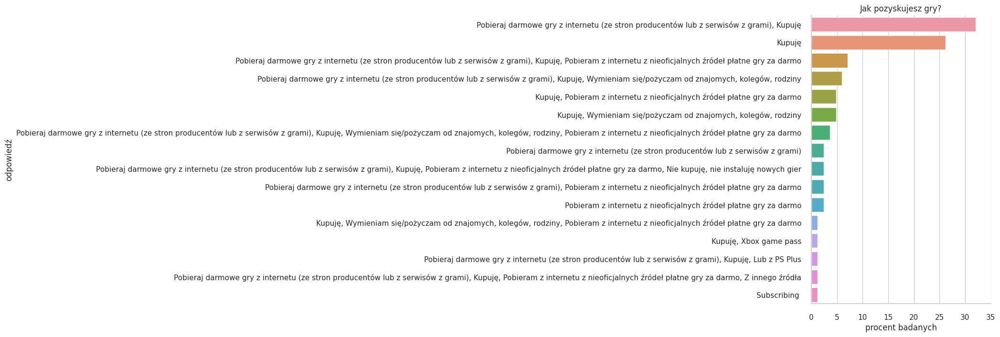




Jakie gatunki gier multi-player wybierasz?


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


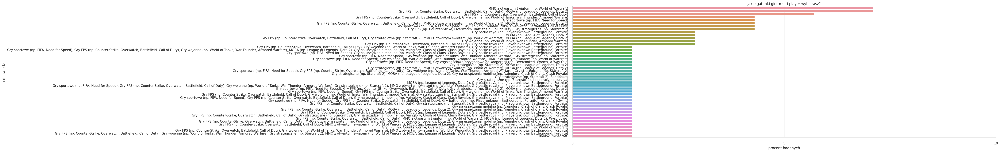




Jaką preferujesz metodę płatności, jeśli chodzi o gry? 


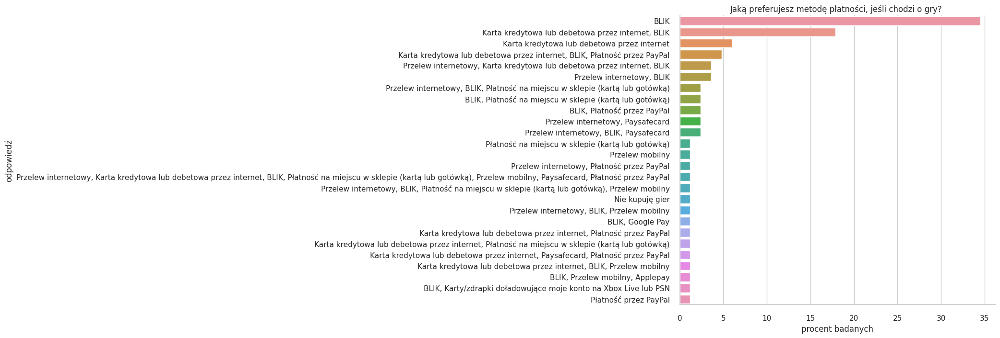




Dlaczego kupujesz fizyczne wersje gry? 


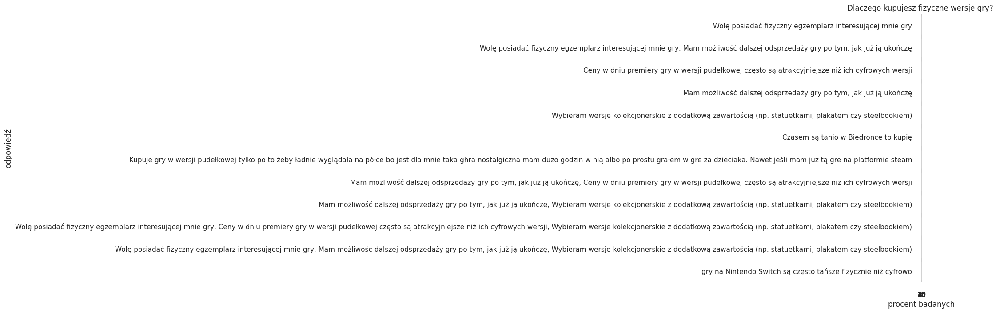




Dlaczego kupujesz cyfrowe wersje gry? 


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


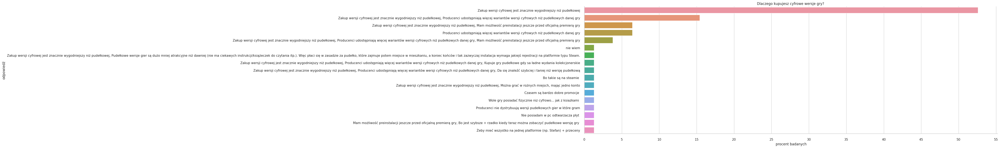

In [ ]:
sns.set(font_scale = 1.0, style = 'whitegrid')

for xx in llspec[-5:]:
  print(xx)
  dd = df.groupby([xx], as_index = False).size()
  ss = dd['size'].sum()
  dd['size'] = (dd['size']*100/ss).round(1)
  mm = dd['size'].max() + 5

  g = sns.catplot(kind = 'bar', data = dd.sort_values(by = 'size', ascending=False), y = xx, x = 'size', aspect = 3, height=7)
  g.set(xlabel = 'procent badanych', ylabel = 'odpowiedź', title = xx, xticks = np.arange(0, mm, 5))
  plt.show()
  print('\n\n')

Sytuacja finasnowa 


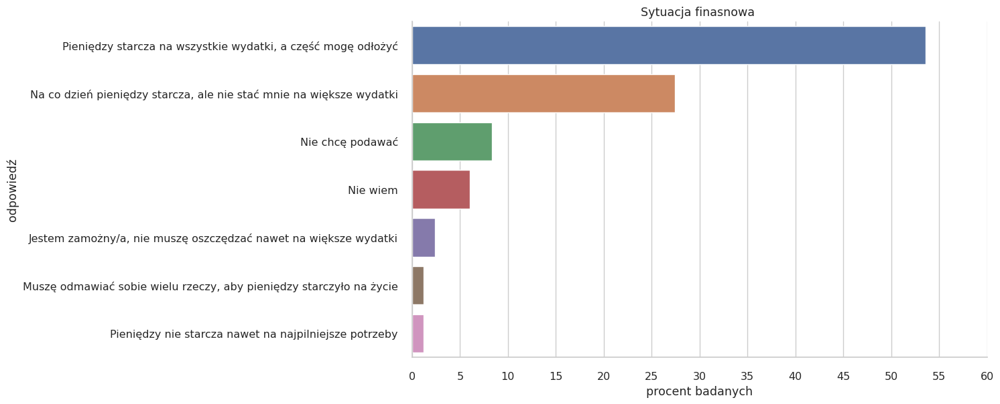




Sytuacja zawodowa 


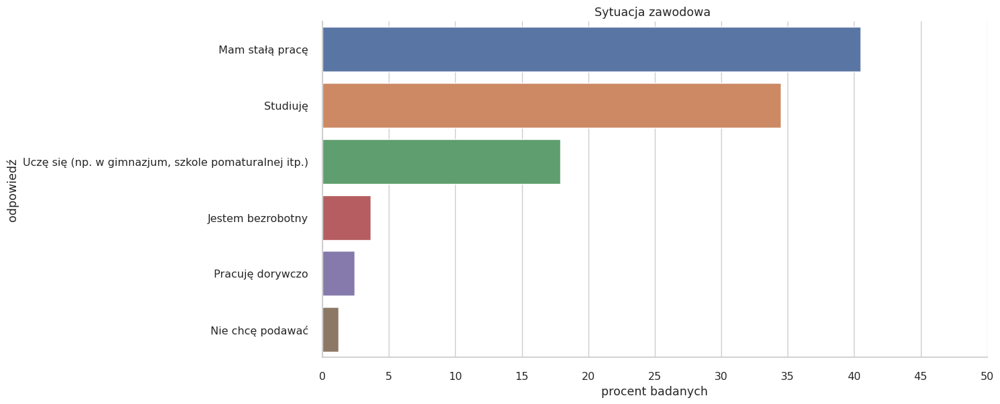




Jakie gry oglądasz? 


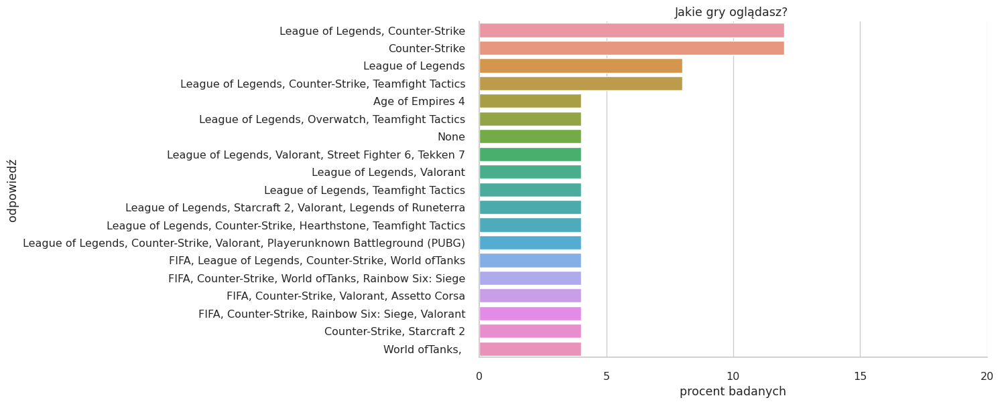




W jaki sposób grasz? 


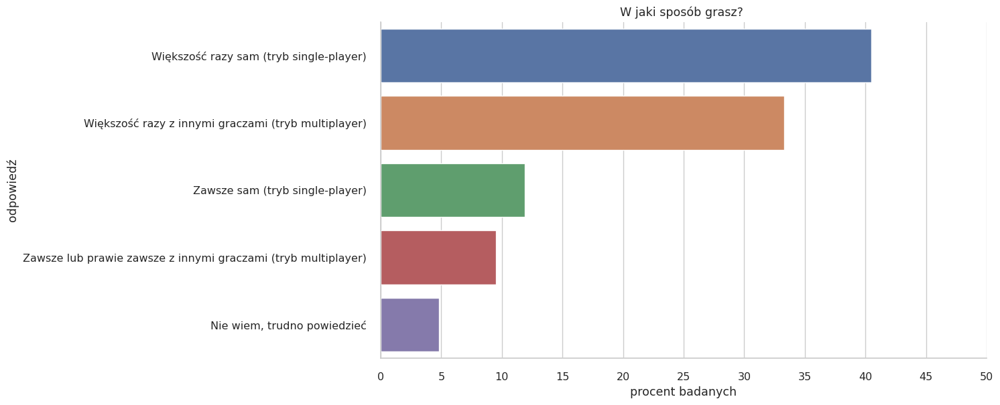




Gdzie oglądasz rozgrywki e-sportowe? 


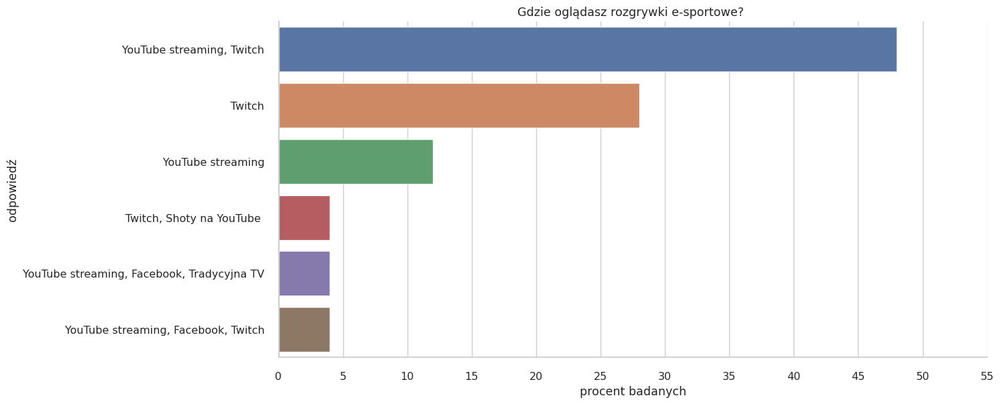




Z których modeli abonentowych korzystasz?


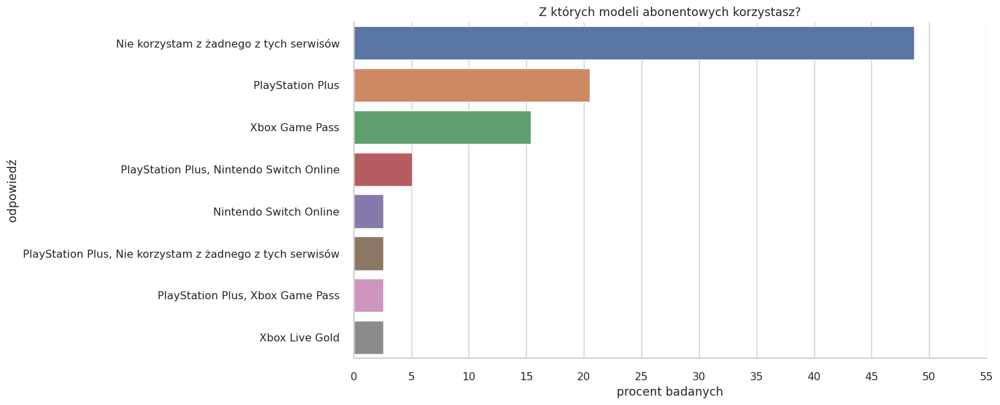




Na jakich konsolach grasz?


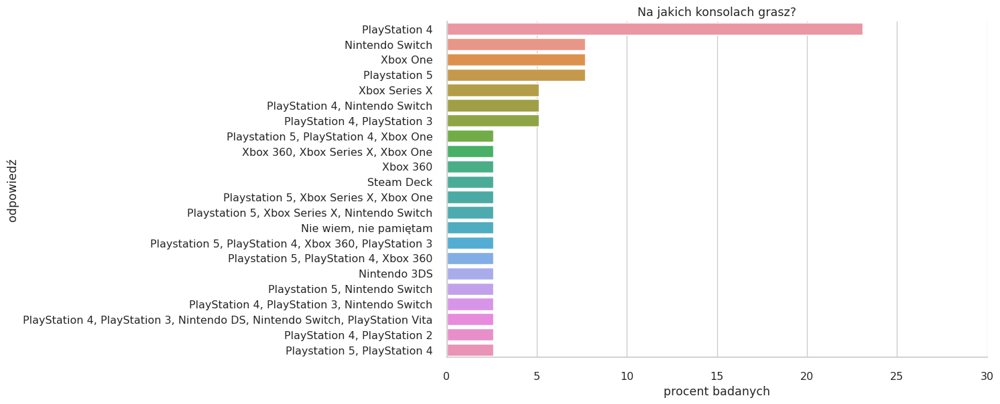




Jak pozyskujesz gry?


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


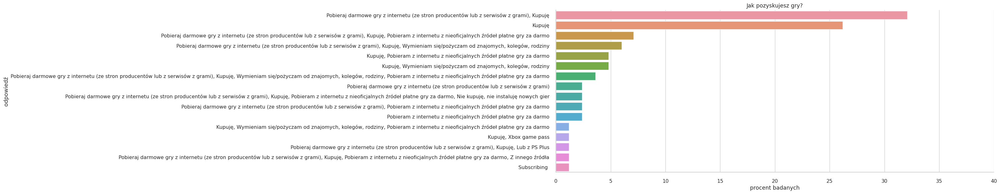




Jakie gatunki gier multi-player wybierasz?


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


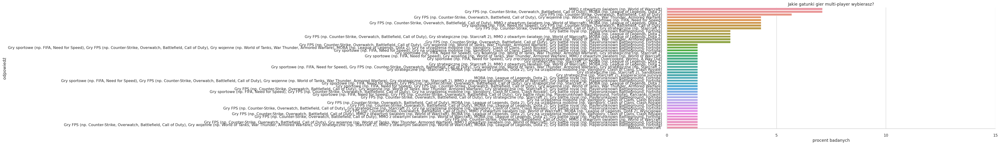




Jaką preferujesz metodę płatności, jeśli chodzi o gry? 


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


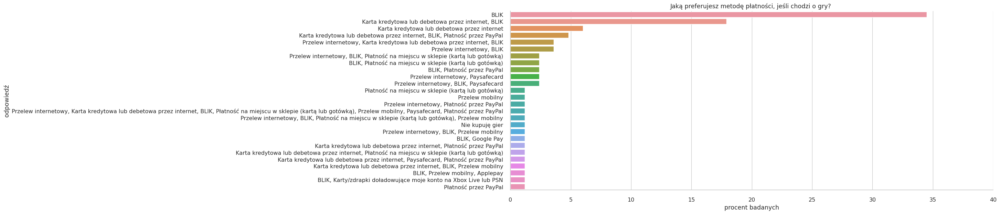




Dlaczego kupujesz fizyczne wersje gry? 


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


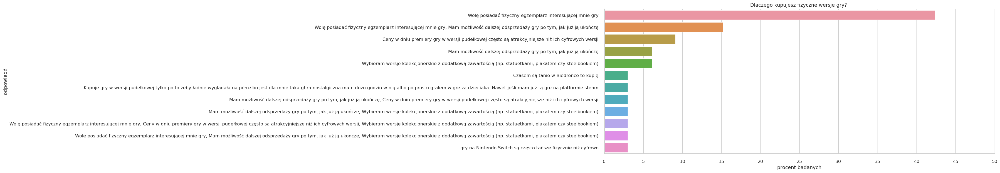




Dlaczego kupujesz cyfrowe wersje gry? 


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


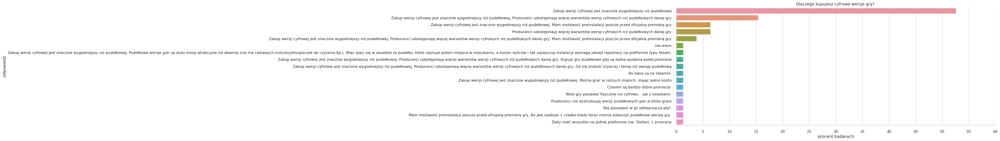

In [ ]:
sns.set(font_scale = 1.08, style = 'whitegrid')

for xx in llspec[:-5]:
  print(xx)
  dd = df.groupby([xx], as_index = False).size()
  ss = dd['size'].sum()
  dd['size'] = (dd['size']*100/ss).round(1)
  mm = dd['size'].max() + 10

  g = sns.catplot(kind = 'bar', data = dd.sort_values(by = 'size', ascending=False), y = xx, x = 'size', aspect = 2.5, height=6)
  g.set(xlabel = 'procent badanych', ylabel = 'odpowiedź', title = xx, xticks = np.arange(0, mm, 5))
  plt.show()
  print('\n\n')

Jak często grasz?


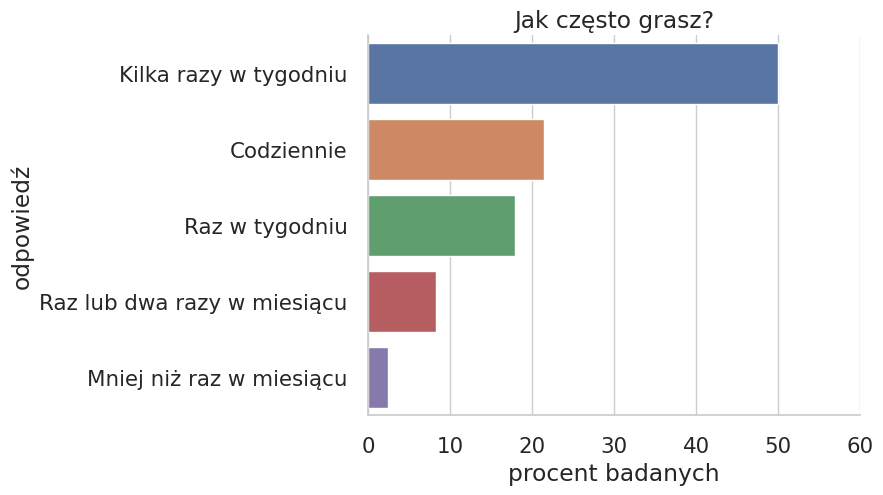




Ile czasu średnio spędzasz w grze podczas jednej sesji? 


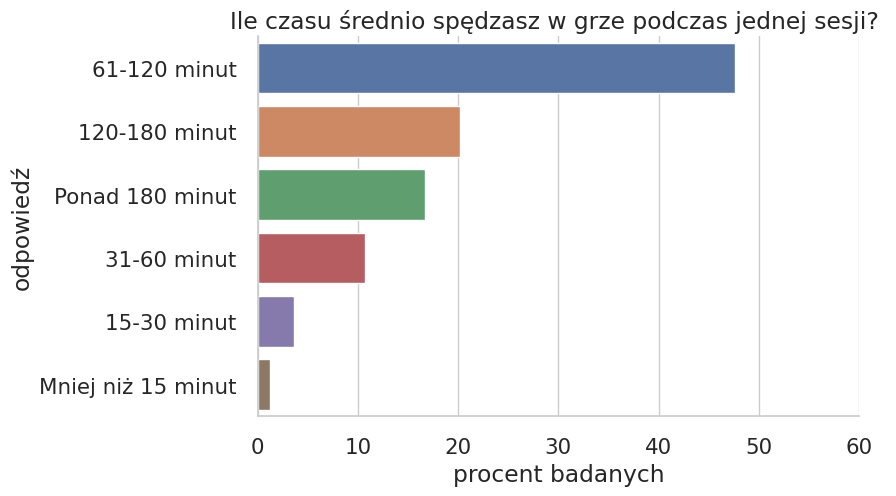




Czy grasz na komputerze lub laptopie?


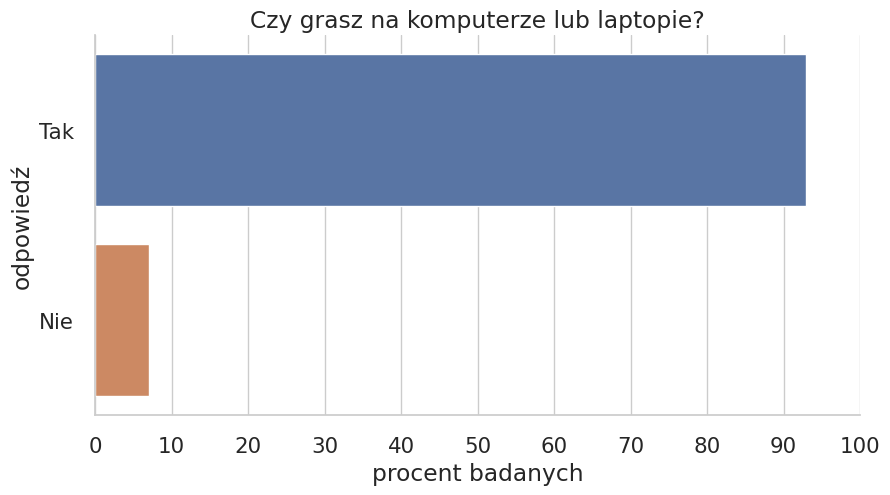




W jakie gry na komputerze/laptopie grasz?


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


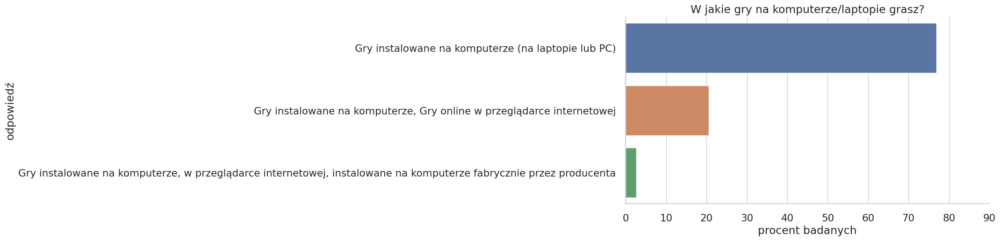




Czy grasz na konsoli? 


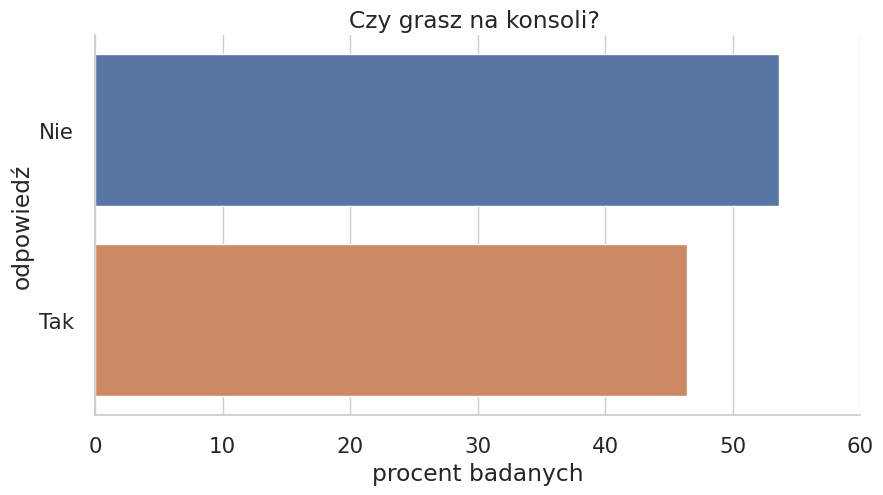




Na jakich konsolach grasz?


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


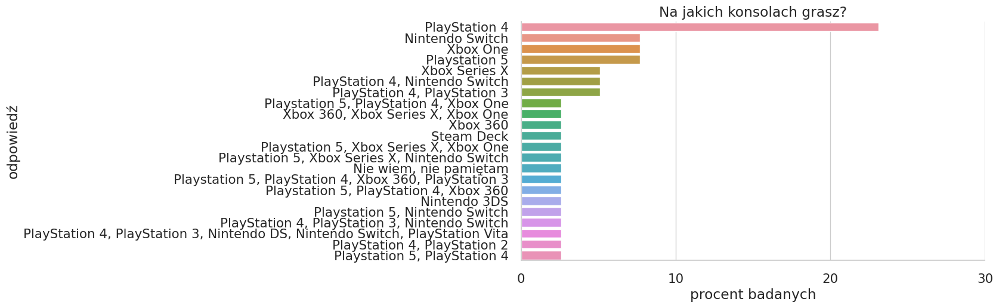




Z których modeli abonentowych korzystasz?


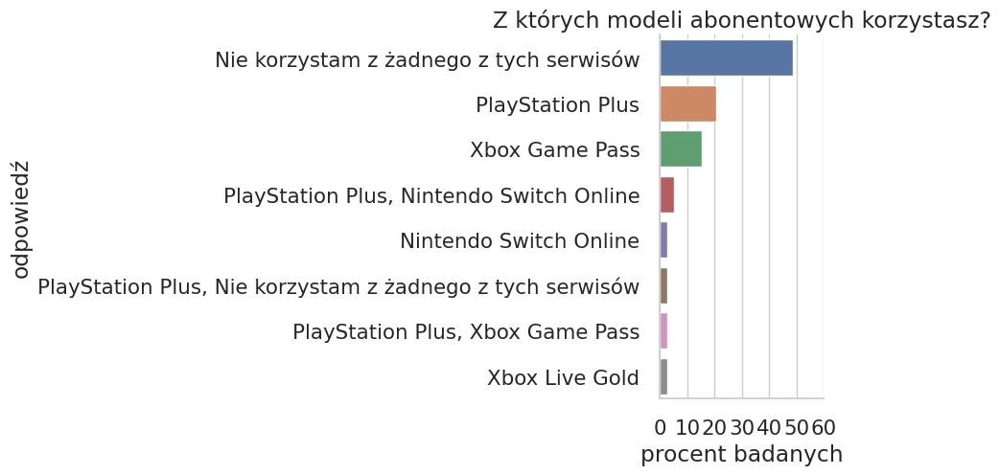




Czy grasz na urządzaniu mobilnym lub tablecie?


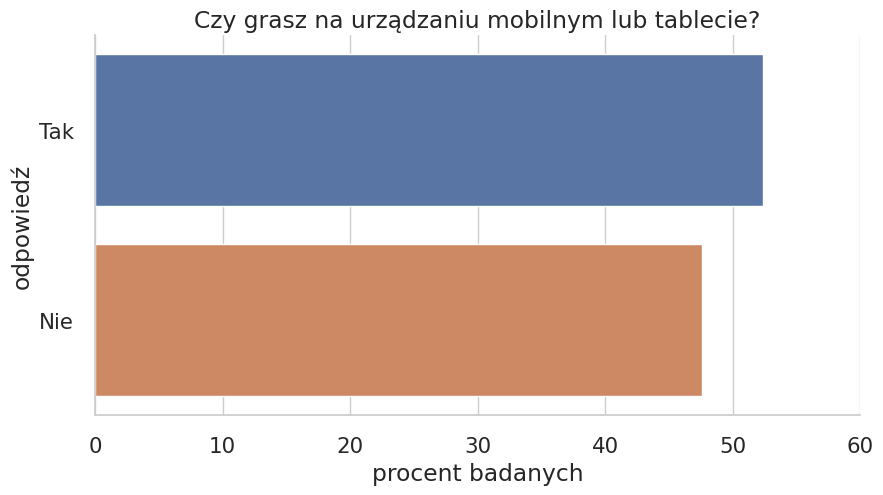




Jaki posiadasz system operacyjny na telefonie/tablecie? 


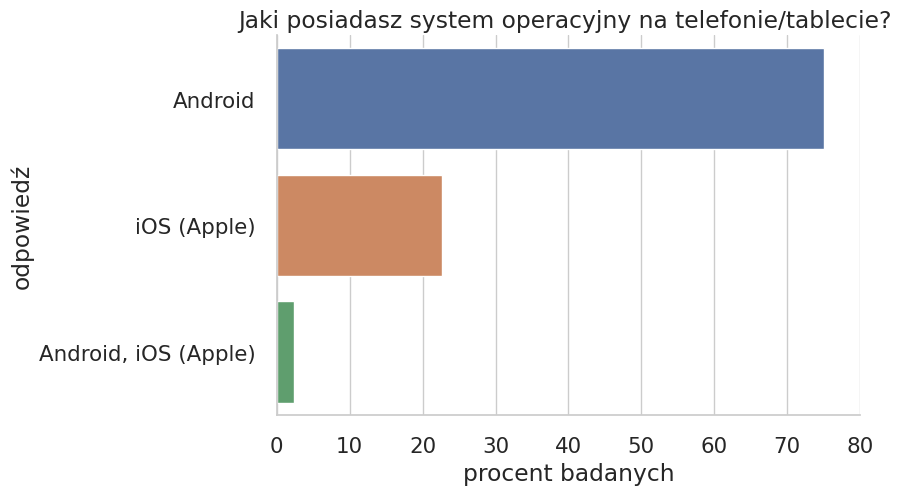




Jak pozyskujesz gry mobilne? 


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


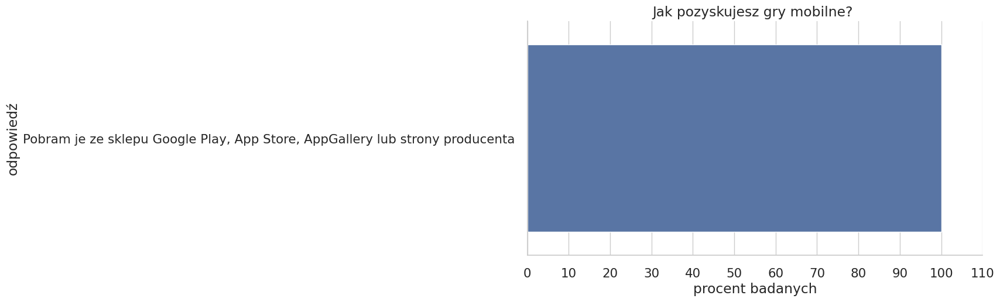




W jaki sposób grasz? 


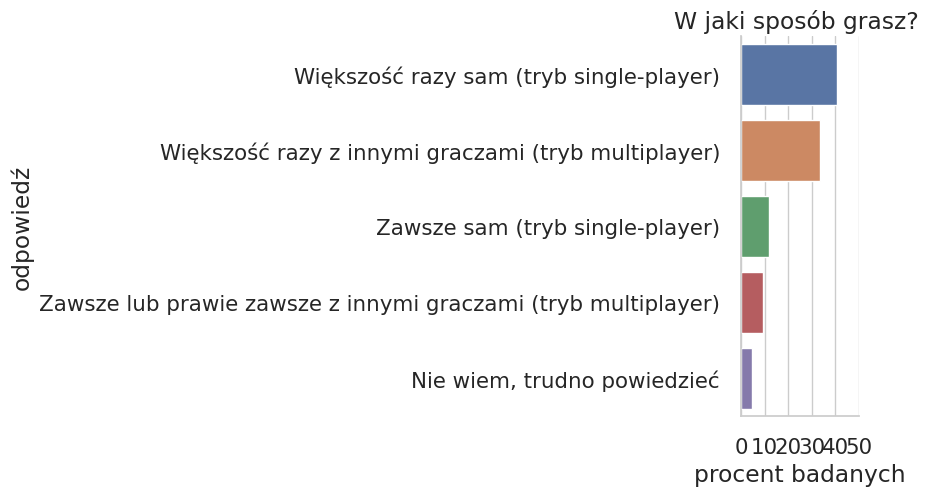




Jak pozyskujesz gry mobilne? 


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


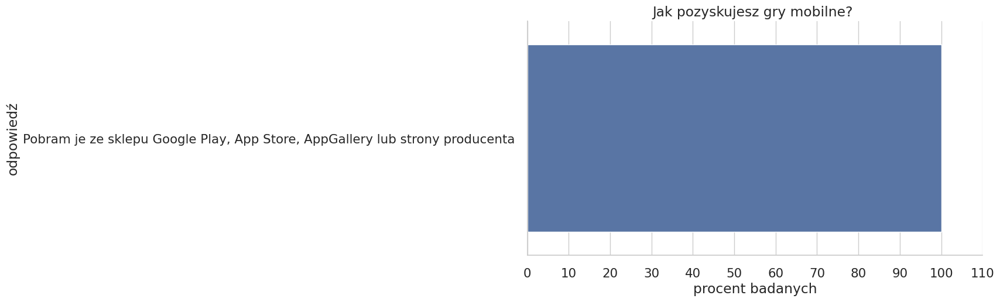




W jaki sposób grasz? 


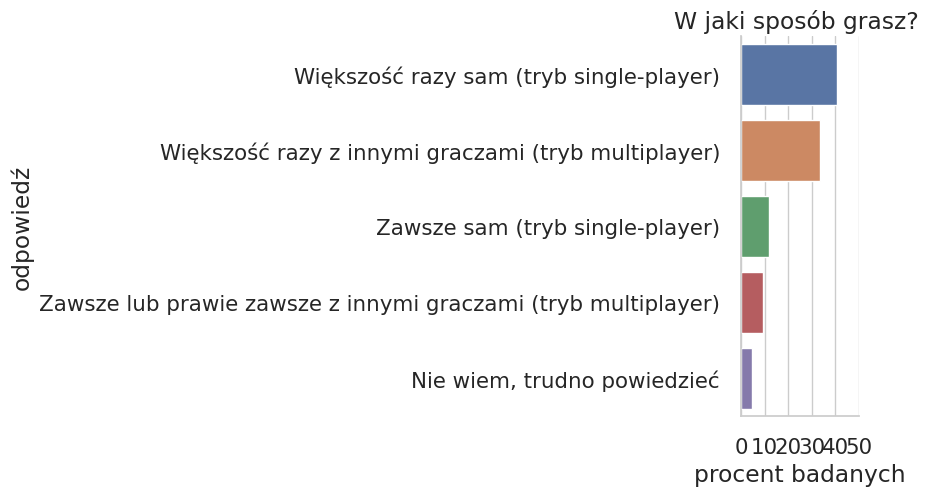




Jakie gatunki gier multi-player wybierasz?


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


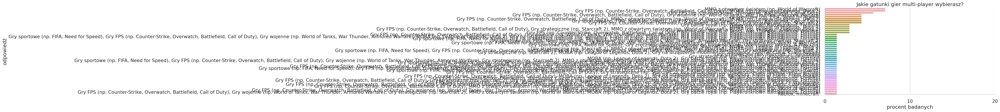




Jak pozyskujesz gry?


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


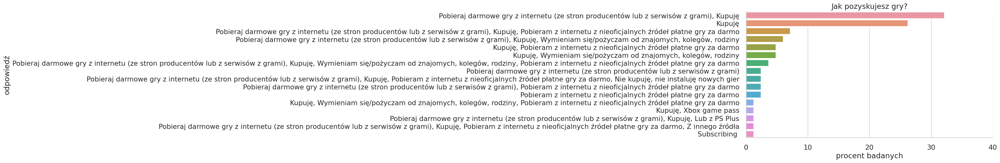




Jakie są twoje średnie wydatki na zakup samych gier (w miesiącu)?


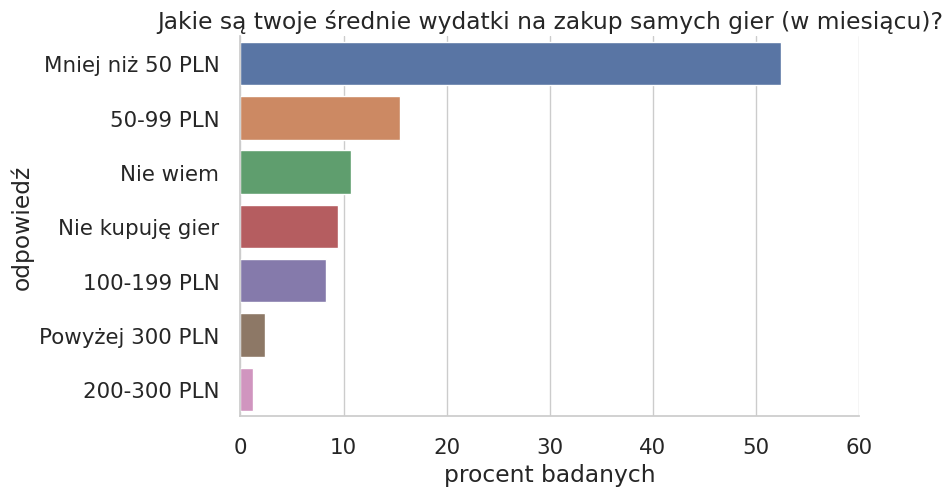




Jakie są twoje średnie wydatki na dodatki do gier i mikropłatności (w miesiącu)? 


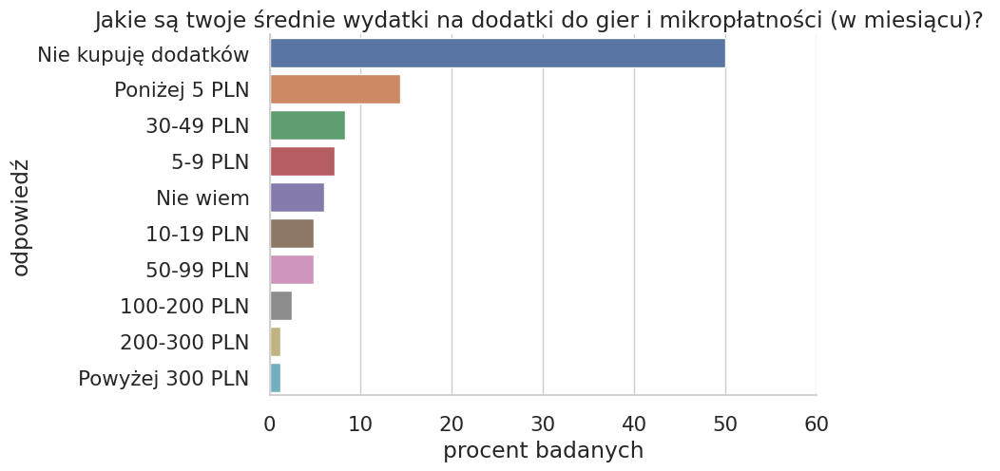




Jaką preferujesz metodę płatności, jeśli chodzi o gry? 


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


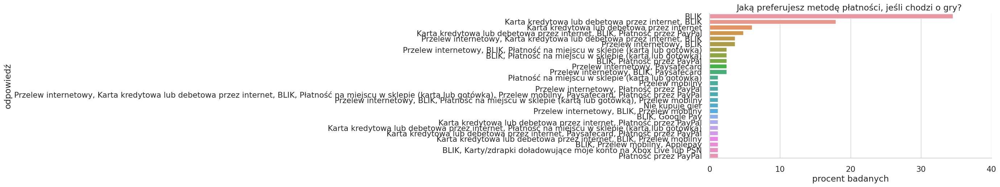




Czy kupujesz gry w wersji cyfrowej? 


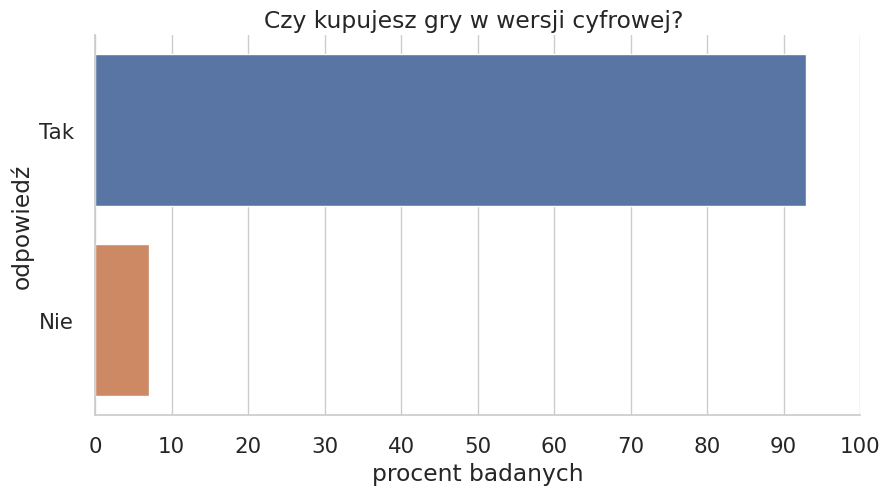




Dlaczego kupujesz cyfrowe wersje gry? 


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


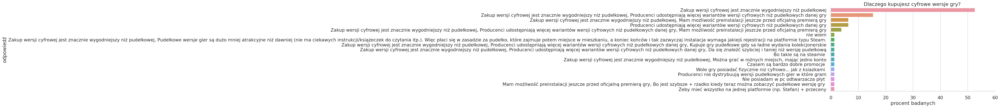




Czy kupujesz gry w wersji fizycznej (pudełkowej)? 


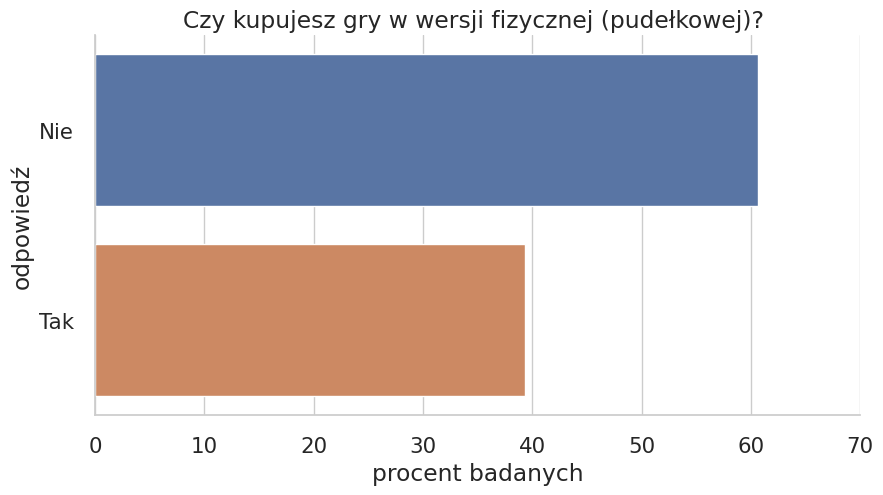




Dlaczego kupujesz fizyczne wersje gry? 


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


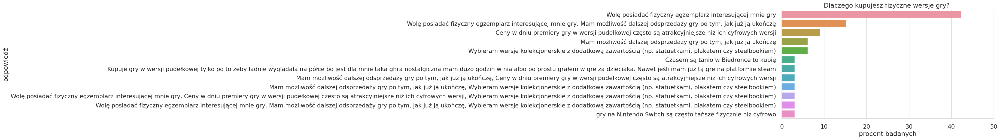




Czy interesujesz się e-sportem? 


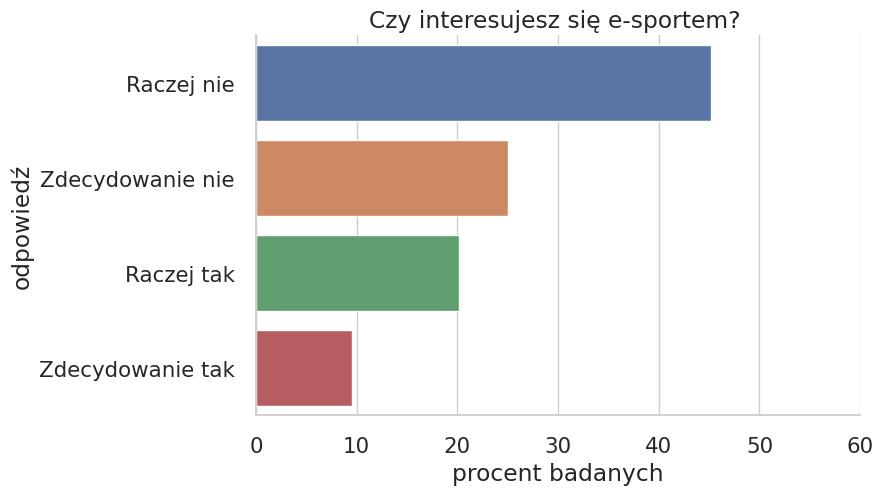




Jak często oglądasz rozgrywki e-sportowe?


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


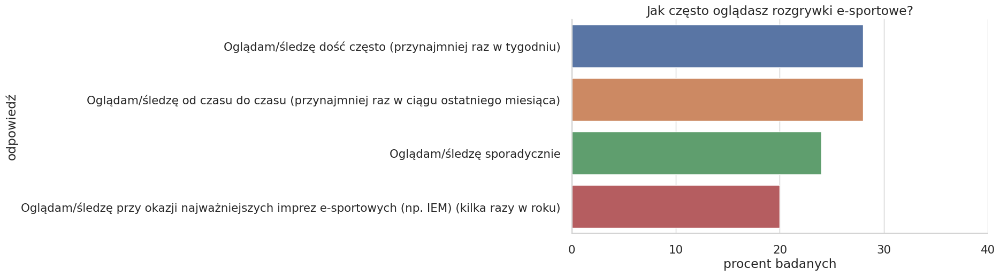




Gdzie oglądasz rozgrywki e-sportowe? 


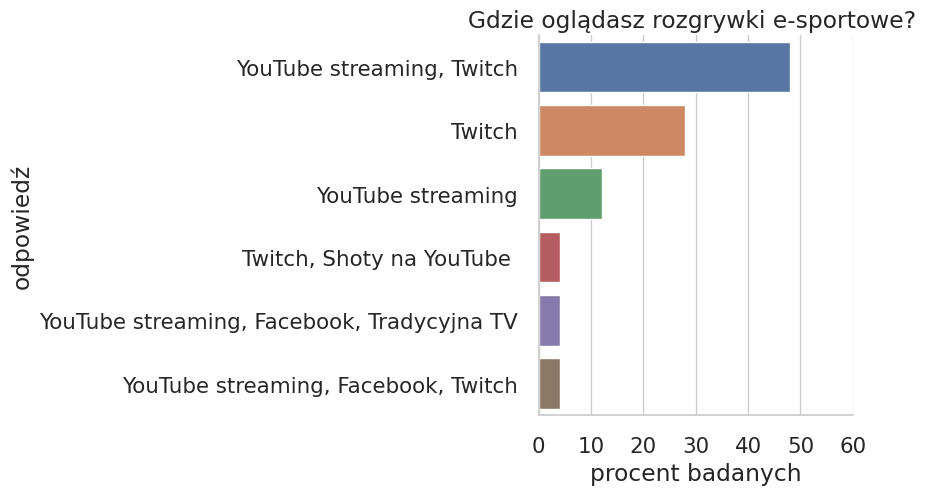




Jakie gry oglądasz? 


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


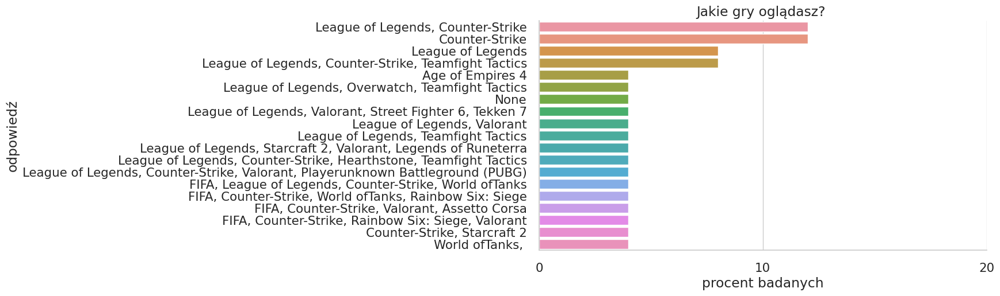




Czy posiadasz urządzenie VR?


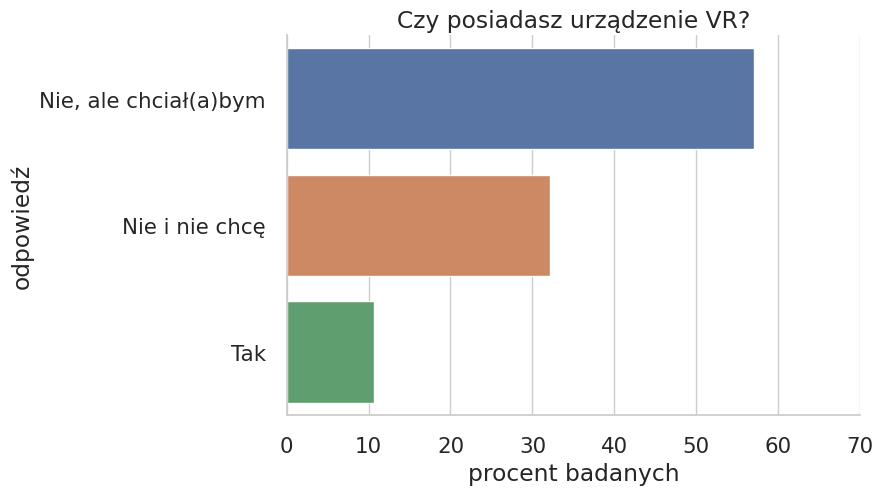




Jakie urządzenie VR posiadasz?


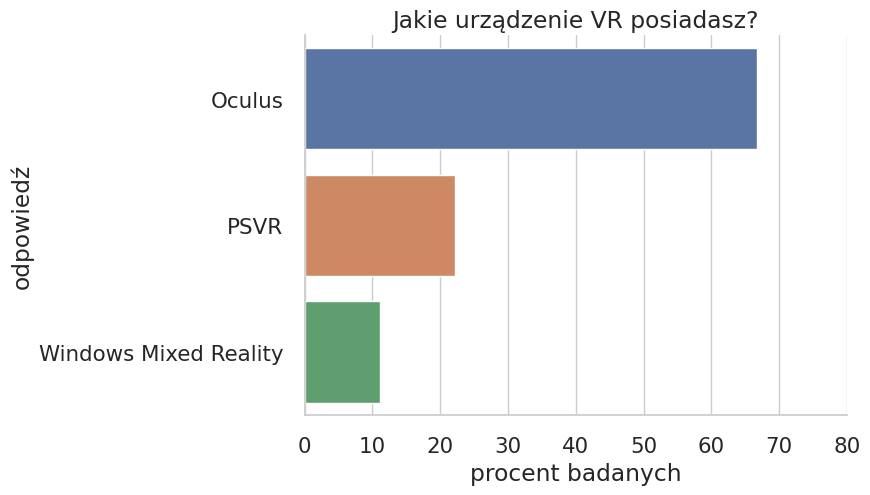




Płeć


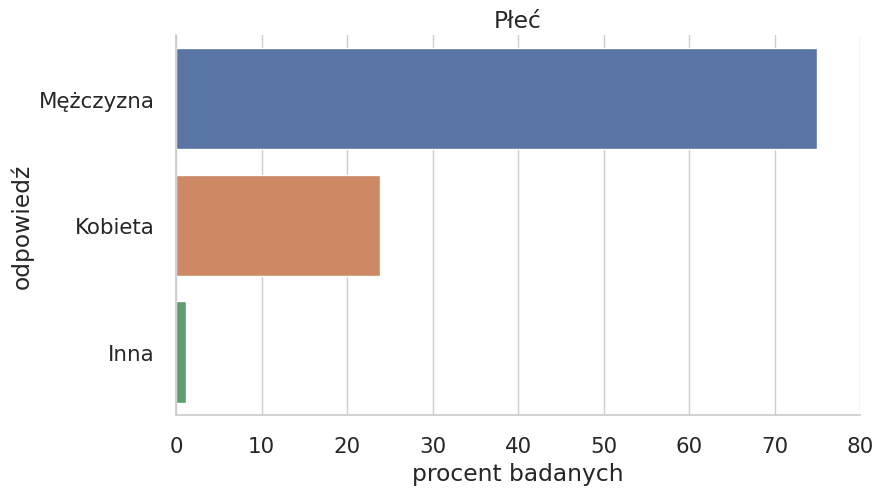




Wiek


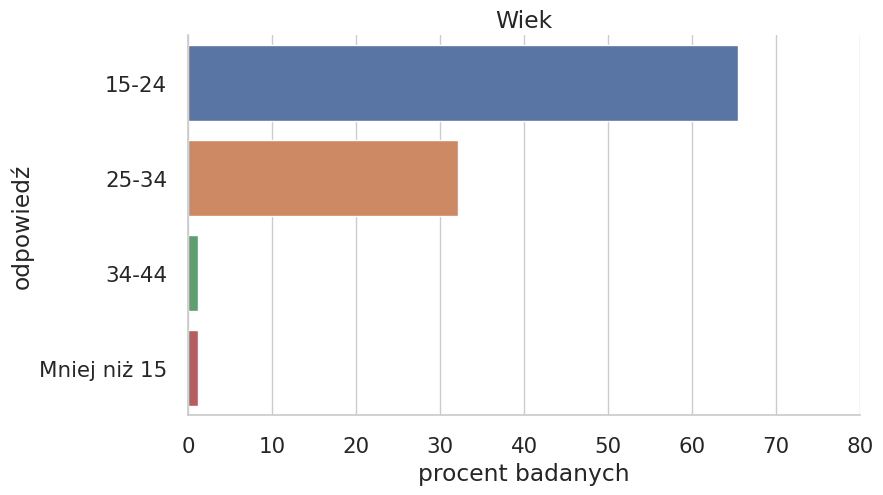




Miejsce zamieszkania 


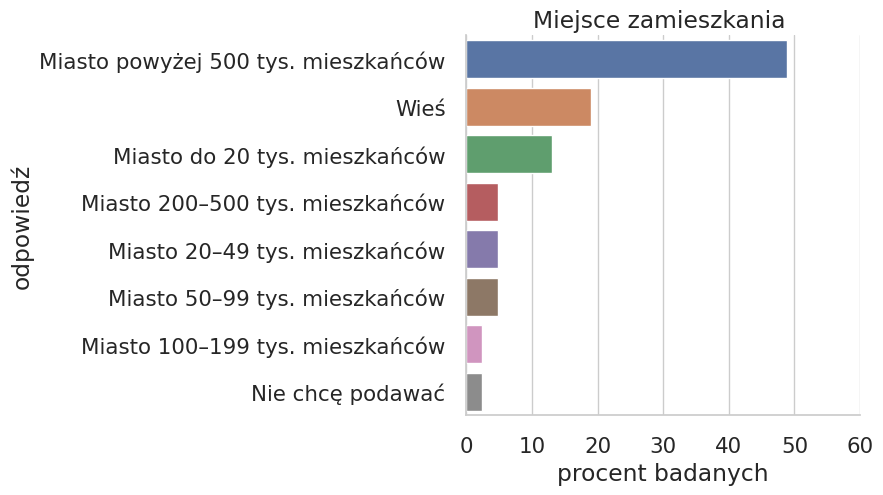




Sytuacja finasnowa 


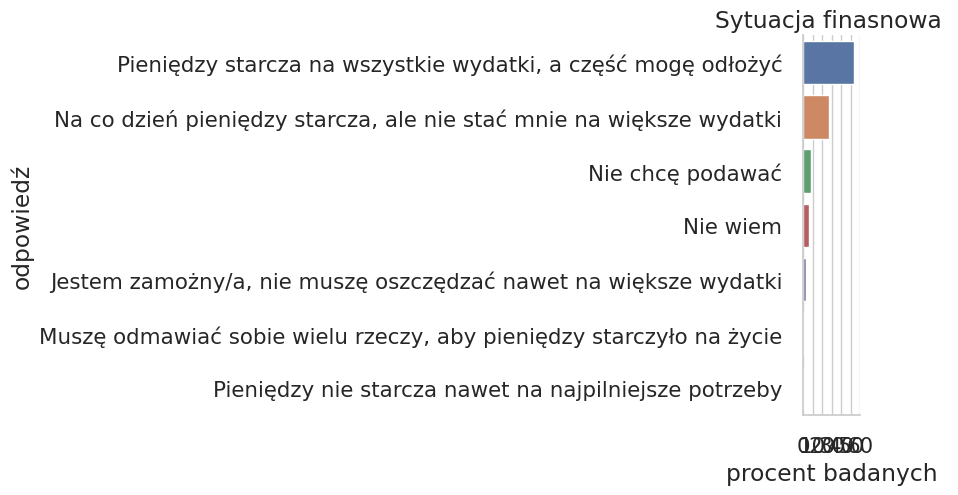




Wykształcenie


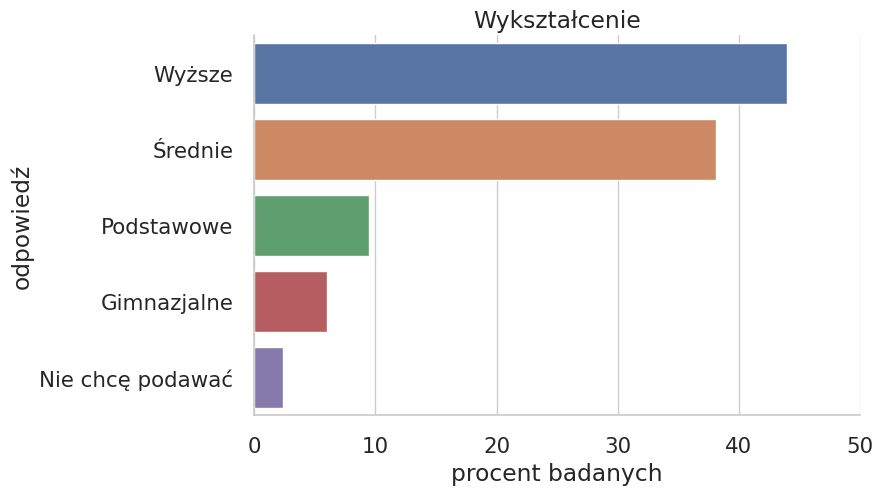




Sytuacja zawodowa 


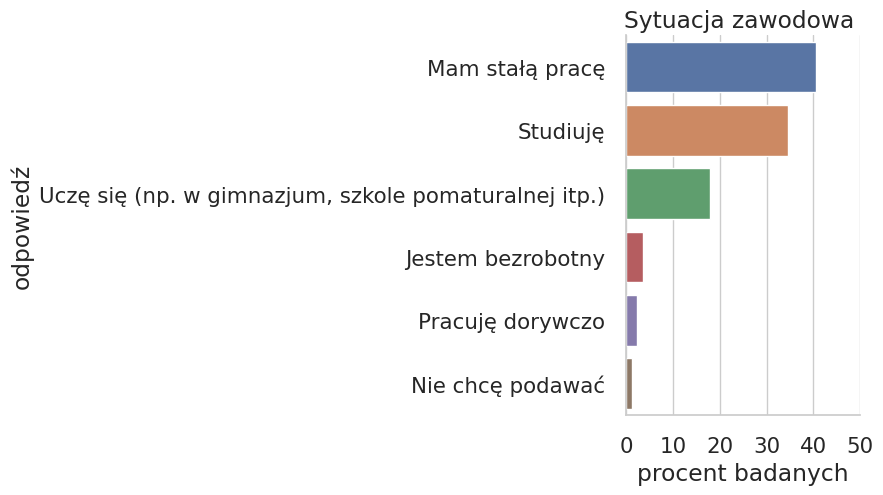

In [ ]:
sns.set(font_scale = 1.25, style = 'whitegrid')

for xx in ll[:]:
  print(xx)
  dd = df.groupby([xx], as_index = False).size()
  ss = dd['size'].sum()
  dd['size'] = (dd['size']*100/ss).round(1)
  mm = dd['size'].max() + 15

  g = sns.catplot(kind = 'bar', data = dd.sort_values(by = 'size', ascending=False), y = xx, x = 'size', aspect = 2)
  g.set(xlabel = 'procent badanych', ylabel = 'odpowiedź', title = xx, xticks = np.arange(0, mm, 10))
  plt.show()
  print('\n\n')

In [ ]:
dd = df.groupby(['Jak często grasz?'], as_index = False).size()
ss = dd['size'].sum()
dd['size'] = (dd['size']*100/ss).round(1)
dd

,Jak często grasz?,size
0,Codziennie,21.4
1,Kilka razy w tygodniu,50.0
2,Mniej niż raz w miesiącu,2.4
3,Raz lub dwa razy w miesiącu,8.3
4,Raz w tygodniu,17.9


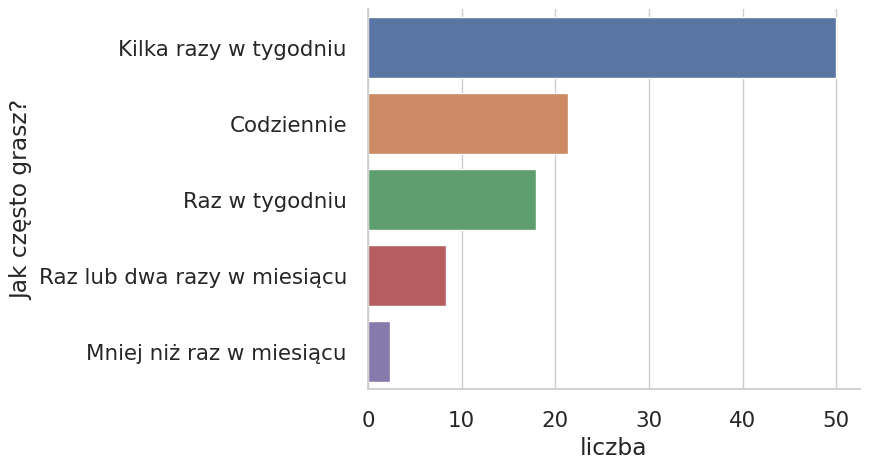

In [ ]:
sns.set(font_scale = 1.4, style = 'whitegrid')
g = sns.catplot(kind = 'bar', data = dd.sort_values(by = 'size', ascending=False), y = 'Jak często grasz?', x = 'size', aspect = 1.8)
g.set(xlabel = 'liczba')
plt.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89 entries, 0 to 88
Data columns (total 39 columns):
 #   Column                                                                             Non-Null Count  Dtype         
---  ------                                                                             --------------  -----         
 0   Sygnatura czasowa                                                                  88 non-null     datetime64[ns]
 1   Czy grasz w gry?                                                                   88 non-null     object        
 2   W jakie gatunki grasz?                                                             84 non-null     object        
 3   Jakie są Twoje ulubione gry (max. 3)?                                              79 non-null     object        
 4   Po co grasz?                                                                       84 non-null     object        
 5   Jak często grasz?                                          